In [1]:
import anndata
import scanpy as sc
import pandas as pd 
import gc
from scipy.sparse import issparse
import numpy as np
import matplotlib.pyplot as plt

In [2]:
sc.settings.verbosity = 1  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(3, 3), facecolor="white")

/tmp/ipykernel_8642/174976041.py:2: FutureWarning: Use `print_header` instead
  sc.logging.print_versions()


In [3]:
df_ctrl = pd.read_csv("./GSE173385/GSM5266942_C5_matrix.tsv.gz", sep="\t", compression="gzip", index_col=0)
df_uv = pd.read_csv("/./GSE173385/GSM5266943_UV_matrix.tsv.gz", sep="\t", compression="gzip", index_col=0)



In [4]:
adata_ctrl = sc.AnnData(df_ctrl.T)
adata_uv = sc.AnnData(df_uv.T)

In [5]:
adata_merged = adata_ctrl.concatenate(
    adata_uv,
    batch_key="group",
    batch_categories=["Ctrl", "UV"]
)


/tmp/ipykernel_8642/1178892863.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_merged = adata_ctrl.concatenate(


In [6]:
adata_merged

AnnData object with n_obs × n_vars = 14600 × 20195
    obs: 'group'

# Processing

In [7]:
adata = adata_merged

In [8]:
adata.layers["counts"] = adata.X.copy()

In [9]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

In [10]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

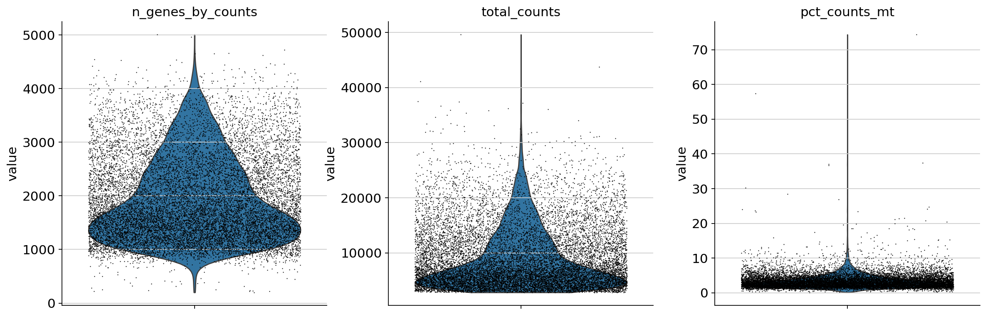

In [11]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

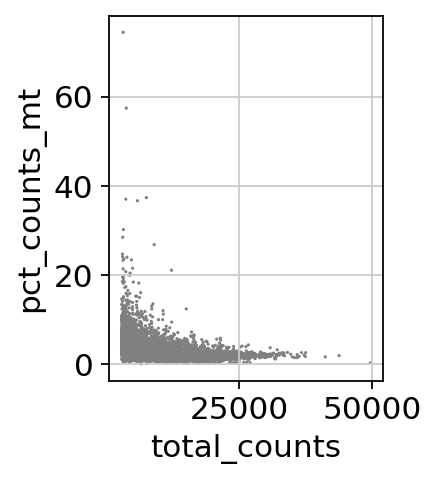

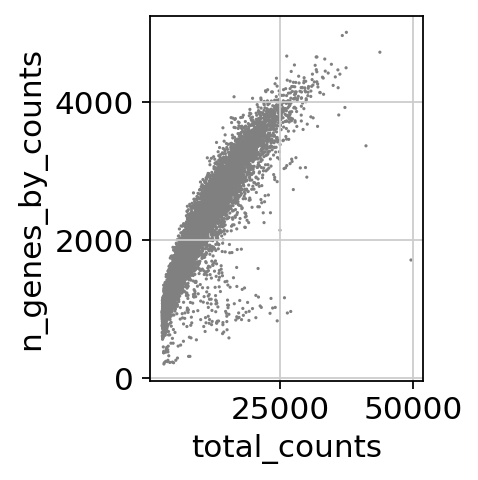

In [12]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [13]:
adata = adata[adata.obs.n_genes_by_counts < 4000, :]
adata = adata[adata.obs.pct_counts_mt < 10, :]

In [14]:
sc.pp.normalize_total(adata, target_sum=1e4)

/home/jxfeng/miniforge3/lib/python3.12/site-packages/scanpy/preprocessing/_normalization.py:208: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [15]:
sc.pp.log1p(adata)

In [16]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

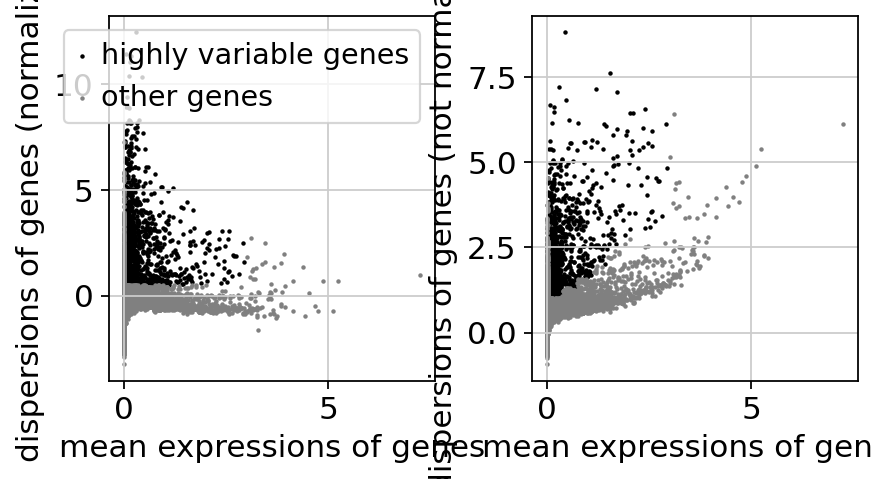

In [17]:
sc.pl.highly_variable_genes(adata)

In [18]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])

In [19]:
sc.pp.scale(adata, max_value=10)

# Principal component analysis

In [20]:
adata.var_names

Index(['Gnai3', 'Cdc45', 'H19', 'Scml2', 'Apoh', 'Narf', 'Cav2', 'Klf6',
       'Scmh1', 'Cox5a',
       ...
       'AC162302.2', 'AC165274.1', 'AC139671.1', 'AC163018.2', 'AC140304.2',
       'AC123724.3', 'AL589670.5', 'AC161165.6', 'AL591952.3', 'AC138177.5'],
      dtype='object', length=19574)

In [21]:
sc.tl.pca(adata)

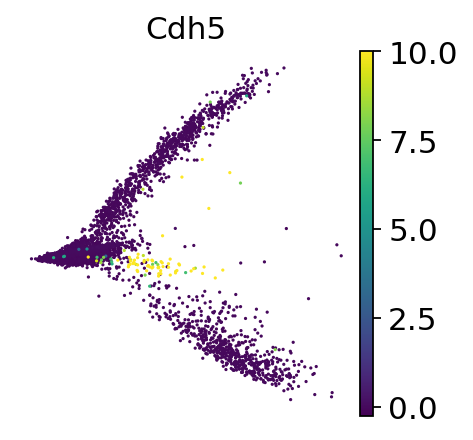

In [22]:
sc.pl.pca(adata, color='Cdh5')

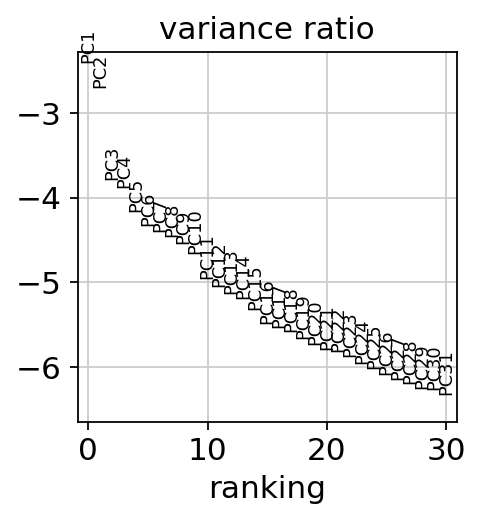

In [23]:
sc.pl.pca_variance_ratio(adata,log=True)

# BBKNN

In [24]:
%%time
sc.external.pp.bbknn(adata, batch_key="group")  # running bbknn

CPU times: user 7.34 s, sys: 199 ms, total: 7.54 s
Wall time: 7.57 s


In [25]:
# sc.pp.neighbors(adata)

In [26]:
sc.tl.umap(adata)

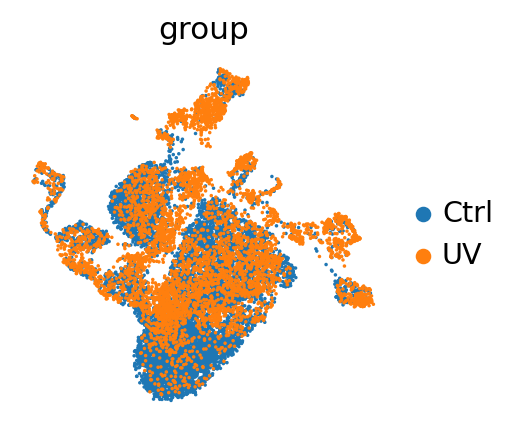

In [27]:
sc.pl.umap(adata, color=["group"], size=10)

In [28]:
adata.write_h5ad('./UV/adata_GSM5266942.h5ad')

# Clustering the neighborhood graph

In [29]:
sc.tl.leiden(adata, resolution = 0.6, flavor="igraph", n_iterations=2)

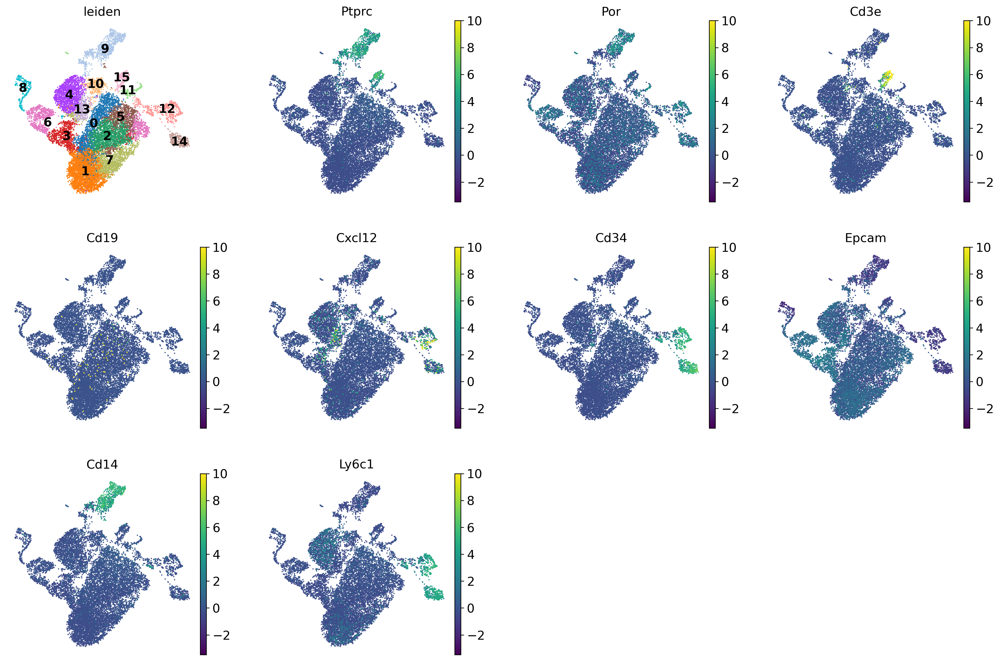

In [30]:
genes = ['Ptprc', 'Por', 'Cd3e', 'Cd19', 'Cxcl12', 'Cd34', 'Epcam',  'Cd14', 'Ly6c1']

# Compute the global min and max for the selected genes
min_value = np.min([adata[:, gene].X.min() for gene in genes])
max_value = np.max([adata[:, gene].X.max() for gene in genes])

# Plot with shared color scale
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (120)}):
    sc.pl.umap(adata, color=['leiden'] + genes, legend_loc='on data',
               vmin=min_value, vmax=max_value)


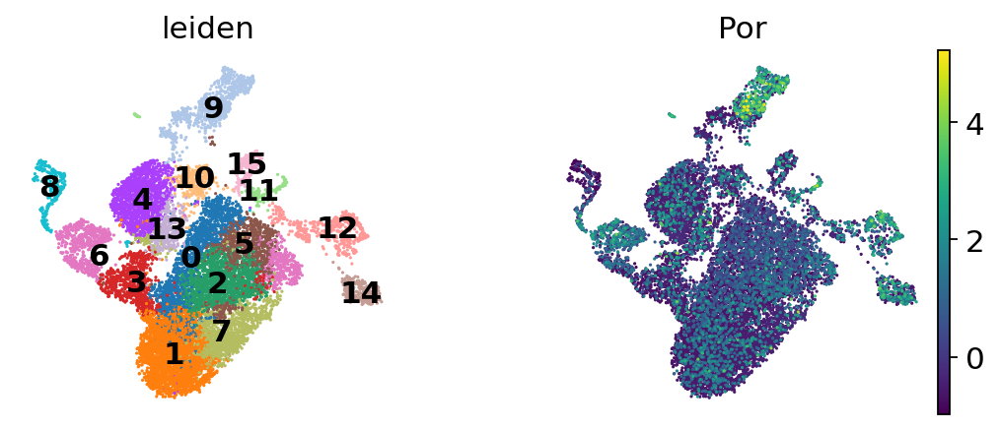

In [31]:
sc.pl.umap(adata, color=['leiden', 'Por'], legend_loc='on data')

# Finding marker genes

In [32]:
# sc.tl.rank_genes_groups(adata, 'leiden', method = 'logreg')
# sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# # sc.pl.rank_genes_groups_violin(adata, n_genes=10)

# pd.DataFrame(adata.uns['rank_genes_groups']['names']).to_csv('./marker_mtx.csv')

# top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)
# print(top_markers['10'])

# top_markers


# import functools
# import operator
# marker_list = functools.reduce(operator.iconcat, top_markers.values.tolist(),[])
# marker_list

# sc.tl.dendrogram(adata, 'leiden')
# sc.pl.dotplot(adata, marker_list, groupby='leiden', standard_scale = 'var', swap_axes = False, dendrogram = True, figsize = (18,8), dot_max=1.0, dot_min=0.01)

# # adata.write_h5ad('/home/jxfeng/DataProcessing/Combined_EC/PLX+6_CD45_CBM.h5ad')

# # 2025-02-28 09:16

# # adata = sc.read_h5ad('/home/jxfeng/DataProcessing/Combined_EC/PLX+6_CD45_CBM.h5ad')

# Cell Type Annotation

In [33]:
import decoupler as dc
import numpy as np

#### https://decoupler-py.readthedocs.io/en/latest/notebooks/cell_annotation.html

In [34]:
import omnipath
print(omnipath.__version__)  

#### Need pip3 install numpy==1.26.4


1.0.8


In [35]:
# dc.show_resources()
markers = dc.get_resource('PanglaoDB')
# markers = dc.get_resource('Ramilowski2015')
# markers = dc.get_resource('CellTypist')
markers

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
0,CTRB1,False,Enterocytes,Endoderm,True,0.000000,0.004394,True,0.003311,0.020480,9606,GI tract,0.017
1,CTRB1,True,Acinar cells,Endoderm,True,1.000000,0.000629,True,0.957143,0.015920,9606,Pancreas,0.017
2,KLK1,True,Endothelial cells,Mesoderm,True,0.000000,0.008420,True,0.000000,0.014915,9606,Vasculature,0.013
3,KLK1,False,Goblet cells,Endoderm,True,0.588235,0.005039,True,0.903226,0.012408,9606,GI tract,0.013
4,KLK1,False,Epithelial cells,Mesoderm,True,0.000000,0.008233,True,0.225806,0.013758,9606,Epithelium,0.013
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8456,SLC14A1,True,Urothelial cells,Mesoderm,True,0.000000,0.018170,True,0.000000,0.000000,9606,Urinary bladder,0.008
8457,UPK3A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8458,UPK1A,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8459,UPK2,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000


In [36]:
print(list(markers.organ.unique()))


['GI tract', 'Pancreas', 'Vasculature', 'Epithelium', 'Kidney', 'Immune system', 'Connective tissue', 'Reproductive', 'Mammary gland', 'Lungs', 'Skin', 'Liver', 'Blood', 'Brain', 'Bone', 'Smooth muscle', 'Skeletal muscle', 'Heart', 'Olfactory system', 'Thymus', 'Eye', 'Embryo', 'Parathyroid glands', <NA>, 'Adrenal glands', 'Zygote', 'Oral cavity', 'Placenta', 'Urinary bladder', 'Thyroid']


In [37]:
# filtered_markers = markers[(markers["organ"].isin(["Skin"]))]

In [38]:
# markers = filtered_markers[~filtered_markers.duplicated(['cell_type', 'genesymbol'])]

In [39]:
markers = markers[markers.mouse == True]

In [40]:
markers = markers.drop_duplicates(subset=['cell_type', 'genesymbol'])

In [41]:
markers['genesymbol']  = [s.capitalize() for s in markers['genesymbol']]

In [42]:
pd.set_option('display.max_rows', 30)

In [43]:
markers

,genesymbol,canonical_marker,cell_type,germ_layer,human,human_sensitivity,human_specificity,mouse,mouse_sensitivity,mouse_specificity,ncbi_tax_id,organ,ubiquitiousness
0,Ctrb1,False,Enterocytes,Endoderm,True,0.000000,0.004394,True,0.003311,0.020480,9606,GI tract,0.017
1,Ctrb1,True,Acinar cells,Endoderm,True,1.000000,0.000629,True,0.957143,0.015920,9606,Pancreas,0.017
2,Klk1,True,Endothelial cells,Mesoderm,True,0.000000,0.008420,True,0.000000,0.014915,9606,Vasculature,0.013
3,Klk1,False,Goblet cells,Endoderm,True,0.588235,0.005039,True,0.903226,0.012408,9606,GI tract,0.013
4,Klk1,False,Epithelial cells,Mesoderm,True,0.000000,0.008233,True,0.225806,0.013758,9606,Epithelium,0.013
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8456,Slc14a1,True,Urothelial cells,Mesoderm,True,0.000000,0.018170,True,0.000000,0.000000,9606,Urinary bladder,0.008
8457,Upk3a,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8458,Upk1a,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000
8459,Upk2,True,Urothelial cells,Mesoderm,True,0.000000,0.000000,True,0.000000,0.000000,9606,Urinary bladder,0.000


In [44]:
dc.run_ora(
    mat=adata,
    net=markers,
    source='cell_type',
    target='genesymbol',
    min_n=3,
    verbose=True,
    use_raw=False
)

Running ora on mat with 14271 samples and 19574 targets for 169 sources.


  0%|          | 0/14271 [00:00<?, ?it/s]

In [45]:
adata.obsm['ora_estimate']

source,Acinar cells,Adipocyte progenitor cells,Adipocytes,Adrenergic neurons,Airway epithelial cells,Airway goblet cells,Airway smooth muscle cells,Alpha cells,Alveolar macrophages,Anterior pituitary gland cells,...,Thymocytes,Transient cells,Trichocytes,Trigeminal neurons,Trophoblast cells,Trophoblast progenitor cells,Tuft cells,Undefined placental cells,Urothelial cells,Vascular smooth muscle cells
AAACATCGAAACATCGAACGCTTA-Ctrl,0.696507,-0.000000,0.018649,-0.000000,-0.000000,-0.000000,-0.0,-0.000000,-0.000000,-0.000000,...,-0.000000,1.831074,-0.000000,0.077749,-0.000000,-0.000000,0.458468,-0.000000,-0.000000,0.653738
AAACATCGAACGTGATCTCAATGA-Ctrl,0.241010,-0.000000,0.002992,-0.000000,0.854537,-0.000000,-0.0,0.129415,0.154667,0.211257,...,0.257932,0.591374,-0.000000,0.274243,-0.000000,0.854537,0.458468,0.403752,-0.000000,-0.000000
AAACATCGAACTCACCAGTACAAG-Ctrl,-0.000000,-0.000000,0.002992,-0.000000,-0.000000,0.372299,-0.0,0.842523,1.556928,-0.000000,...,0.257932,1.144600,-0.000000,0.274243,0.185996,-0.000000,1.497855,1.081018,0.480515,-0.000000
AAACATCGAAGACGGAAGTGGTCA-Ctrl,0.241010,0.225506,0.142504,-0.000000,-0.000000,0.372299,-0.0,-0.000000,-0.000000,0.623837,...,0.737372,1.144600,-0.000000,-0.000000,0.185996,-0.000000,0.145655,-0.000000,-0.000000,-0.000000
AAACATCGAAGAGATCTCCGTCTA-Ctrl,0.241010,0.225506,0.061022,-0.000000,-0.000000,0.372299,-0.0,-0.000000,0.154667,0.211257,...,-0.000000,0.198126,-0.000000,0.589165,-0.000000,-0.000000,-0.000000,0.403752,-0.000000,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTCACGCATGAAGAGAAGATCGCA-UV,0.241010,0.225506,0.018649,-0.000000,-0.000000,1.007749,-0.0,0.129415,0.481723,-0.000000,...,-0.000000,0.591374,0.854537,-0.000000,0.561135,0.854537,0.145655,0.403752,-0.000000,-0.000000
TTCACGCATGAAGAGAGCGAGTAA-UV,0.241010,-0.000000,0.270593,-0.000000,-0.000000,1.007749,-0.0,0.129415,0.956807,0.211257,...,-0.000000,0.198126,-0.000000,1.010582,0.561135,-0.000000,0.458468,1.965322,-0.000000,-0.000000
TTCACGCATGGAACAACTGGCATA-UV,0.241010,-0.000000,0.951037,0.854537,-0.000000,-0.000000,-0.0,1.388861,4.932654,0.211257,...,0.737372,0.198126,-0.000000,0.274243,-0.000000,-0.000000,1.497855,0.403752,-0.000000,-0.000000
TTCACGCATGGCTTCAATAGCGAC-UV,-0.000000,-0.000000,0.142504,-0.000000,0.854537,1.842920,-0.0,0.129415,-0.000000,-0.000000,...,-0.000000,0.591374,-0.000000,0.589165,1.093102,0.854537,0.458468,0.403752,-0.000000,-0.000000


In [46]:
acts = dc.get_acts(adata, obsm_key='ora_estimate')

In [47]:
# We need to remove inf and set them to the maximum value observed for pvals=0
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts

AnnData object with n_obs × n_vars = 14271 × 169
    obs: 'group', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'group_colors', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'

In [48]:
acts.obsm

AxisArrays with keys: X_pca, X_umap, ora_estimate, ora_pvals

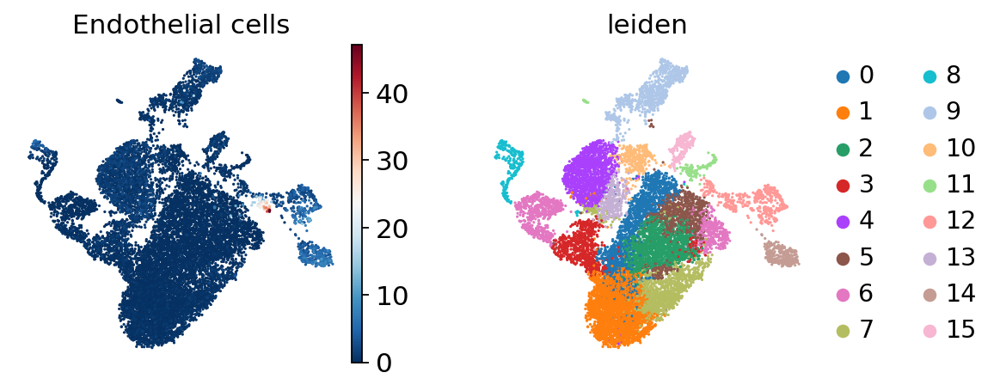

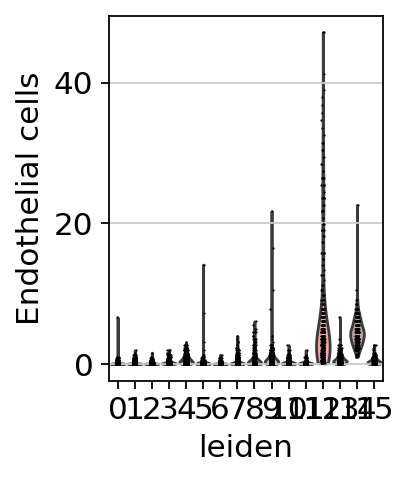

In [49]:
sc.pl.umap(acts, color=['Endothelial cells', 'leiden'], cmap='RdBu_r')
sc.pl.violin(acts, keys=['Endothelial cells'], groupby='leiden')

In [50]:
df = dc.rank_sources_groups(acts, groupby='leiden', reference='rest', method='t-test_overestim_var')
df

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,0,rest,Retinal ganglion cells,11.229352,0.100451,1.187798e-28,5.425347e-28
1,0,rest,Olfactory epithelial cells,10.107777,0.212863,1.254000e-23,4.155412e-23
2,0,rest,Cajal-Retzius cells,9.472846,0.155701,5.447500e-21,1.643978e-20
3,0,rest,Germ cells,8.001662,0.079804,1.774832e-15,3.946667e-15
4,0,rest,Enteric neurons,7.717863,0.120974,1.627964e-14,3.527255e-14
...,...,...,...,...,...,...,...
2699,9,rest,Mammary epithelial cells,-15.648718,-0.526080,2.604653e-49,1.158385e-48
2700,9,rest,Olfactory epithelial cells,-15.677856,-0.327351,3.582954e-50,1.636539e-49
2701,9,rest,Hepatocytes,-17.013191,-0.640056,1.943692e-58,9.124556e-58
2702,9,rest,Principal cells,-17.377187,-0.438161,1.378218e-59,6.654824e-59


In [51]:
n_ctypes = 3
ctypes_dict = df.groupby('group').head(n_ctypes).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
ctypes_dict

{'0': ['Retinal ganglion cells',
  'Olfactory epithelial cells',
  'Cajal-Retzius cells'],
 '1': ['Airway epithelial cells', 'Sebocytes', 'Principal cells'],
 '10': ['Gamma delta T cells', 'Neural stem/precursor cells', 'Trichocytes'],
 '11': ['Follicular cells', 'Enterocytes', 'Hepatocytes'],
 '12': ['Hepatic stellate cells', 'Pancreatic stellate cells', 'Pericytes'],
 '13': ['Retinal progenitor cells',
  'Salivary mucous cells',
  'Myoepithelial cells'],
 '14': ['Fibroblasts', 'Pancreatic stellate cells', 'Hepatic stellate cells'],
 '15': ['T cells', 'NK cells', 'T memory cells'],
 '2': ['Olfactory epithelial cells', 'Enteric neurons', 'Cajal-Retzius cells'],
 '3': ['Cholangiocytes', 'Keratinocytes', 'Retinal progenitor cells'],
 '4': ['Basal cells', 'Myoepithelial cells', 'Salivary mucous cells'],
 '5': ['Endothelial cells (blood brain barrier)',
  'Germ cells',
  'Chromaffin cells'],
 '6': ['Undefined placental cells',
  'Peri-islet Schwann cells',
  'Intercalated cells'],
 '7': ['

In [52]:
annotation_dict = df.groupby('group').head(1).set_index('group')['names'].to_dict()
annotation_dict

{'0': 'Retinal ganglion cells',
 '1': 'Airway epithelial cells',
 '10': 'Gamma delta T cells',
 '11': 'Follicular cells',
 '12': 'Hepatic stellate cells',
 '13': 'Retinal progenitor cells',
 '14': 'Fibroblasts',
 '15': 'T cells',
 '2': 'Olfactory epithelial cells',
 '3': 'Cholangiocytes',
 '4': 'Basal cells',
 '5': 'Endothelial cells (blood brain barrier)',
 '6': 'Undefined placental cells',
 '7': 'Keratinocytes',
 '8': 'Ionocytes',
 '9': 'Dendritic cells'}

In [54]:
# Add cell type column based on annotation
adata.obs['cell_type'] = [annotation_dict[clust] for clust in adata.obs['leiden']]

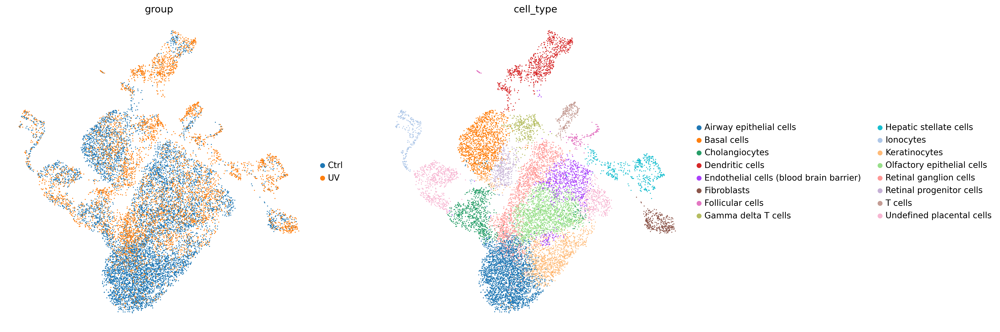

In [55]:
# Visualize
with plt.rc_context({"figure.figsize": (8, 8), "figure.dpi": (120)}):
    sc.pl.umap(adata, color=['group', 'cell_type'], legend_fontsize = 12
               # , legend_loc = 'on data'
              )


In [69]:
adata_skin = adata[adata.obs.cell_type.isin(['Keratinocytes', 'Basal cells', 'Fibroblasts'])]

In [70]:
adata_skin

View of AnnData object with n_obs × n_vars = 2953 × 19574
    obs: 'group', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cell_type'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'group_colors', 'leiden', 'leiden_colors', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap', 'ora_estimate', 'ora_pvals'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [71]:
adata_all = adata

In [72]:
adata = adata_skin

# Recluster

In [73]:
sc.tl.pca(adata)

/home/jxfeng/miniforge3/lib/python3.12/site-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


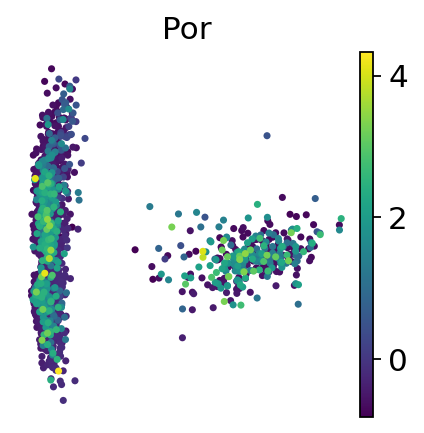

In [74]:
sc.pl.pca(adata, color='Por')

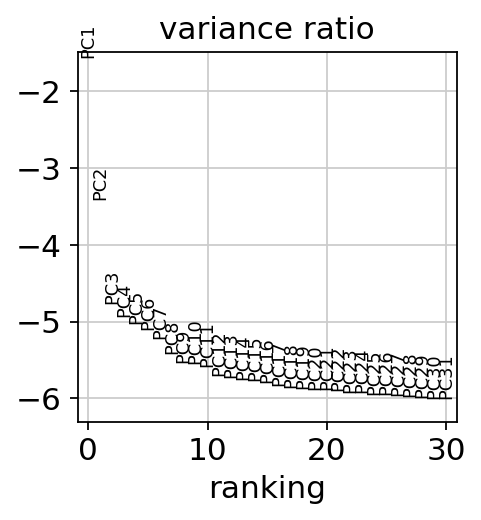

In [75]:
sc.pl.pca_variance_ratio(adata,log=True)

# BBKNN

In [76]:
%%time
sc.external.pp.bbknn(adata, batch_key="group")  # running bbknn

CPU times: user 83.3 ms, sys: 6.9 ms, total: 90.2 ms
Wall time: 77.9 ms


In [25]:
# sc.pp.neighbors(adata)

In [77]:
sc.tl.umap(adata)

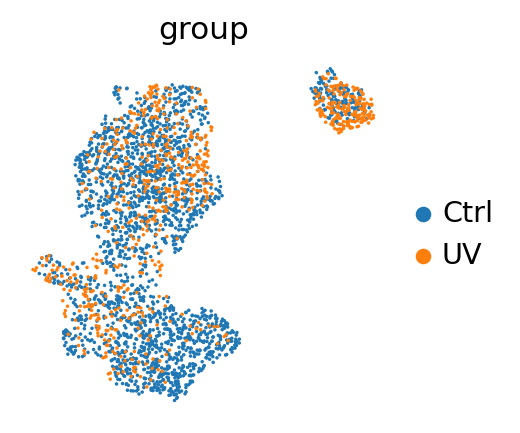

In [78]:
sc.pl.umap(adata, color=["group"], size=10)

In [79]:
adata.write_h5ad('./adata_GSM5266942_filtered.h5ad')

In [56]:
adata =  sc.read_h5ad('./adata_GSM5266942_filtered.h5ad')

# Clustering the neighborhood graph

In [5]:
sc.tl.leiden(adata, resolution = 0.4, flavor="igraph", n_iterations=2)

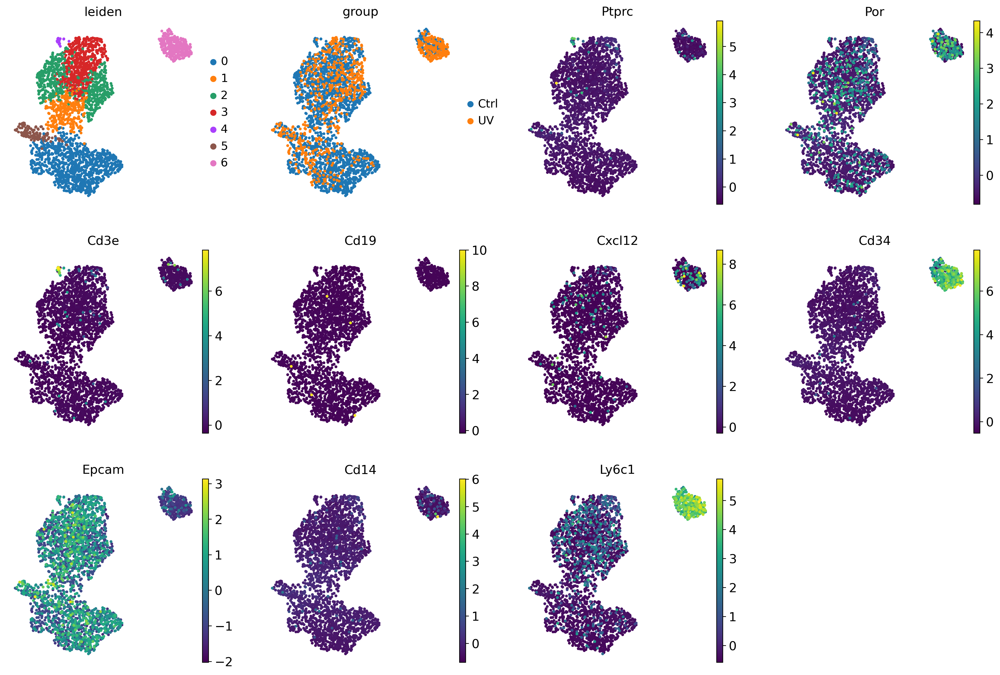

In [6]:
genes = ['Ptprc', 'Por', 'Cd3e', 'Cd19', 'Cxcl12', 'Cd34', 'Epcam',  'Cd14', 'Ly6c1']

# Compute the global min and max for the selected genes
min_value = np.min([adata[:, gene].X.min() for gene in genes])
max_value = np.max([adata[:, gene].X.max() for gene in genes])

# Plot with shared color scale
with plt.rc_context({"figure.figsize": (4, 4), "figure.dpi": (120)}):
    sc.pl.umap(adata, color=['leiden', 'group'] + genes, # legend_loc='on data',
               # vmin=min_value, vmax=max_value
              )


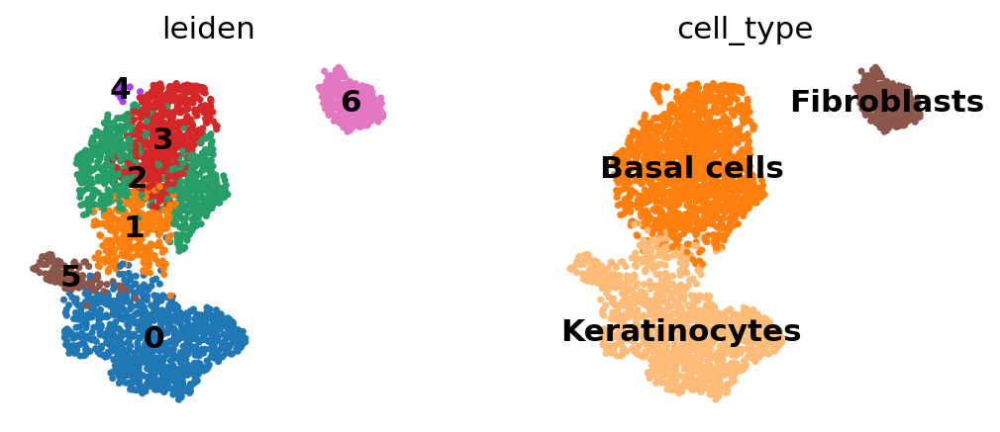

In [7]:
sc.pl.umap(adata, color=['leiden', 'cell_type'], legend_loc='on data')

In [8]:
adata.obs

,group,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type
AAACATCGAAGGACACTTCACGCA-Ctrl,Ctrl,1229,1229,4729,213,4.504123,0,Keratinocytes
AAACATCGAATGTTGCGAATCTGA-Ctrl,Ctrl,1881,1880,6720,158,2.351190,0,Keratinocytes
AAACATCGACATTGGCAGTCACTA-Ctrl,Ctrl,1198,1198,3732,129,3.456592,0,Keratinocytes
AAACATCGAGCAGGAATTCACGCA-Ctrl,Ctrl,1043,1043,4193,278,6.630098,1,Basal cells
AAACATCGAGGCTAACCAACCACA-Ctrl,Ctrl,937,937,3194,164,5.134627,0,Keratinocytes
...,...,...,...,...,...,...,...,...
TTCACGCAATCCTGTAAGATCGCA-UV,UV,1350,1350,5451,188,3.448908,2,Basal cells
TTCACGCACAGATCTGCGACACAC-UV,UV,1507,1507,6225,105,1.686747,6,Fibroblasts
TTCACGCACCGAAGTAATAGCGAC-UV,UV,1242,1242,5676,292,5.144468,0,Keratinocytes
TTCACGCACCTAATCCACCACTGT-UV,UV,1572,1572,4879,116,2.377536,3,Basal cells


In [58]:
adata.obs["treat_celltype"] = adata.obs["group"].astype(str) + "_" + adata.obs["cell_type"].astype(str)


# Finding marker genes

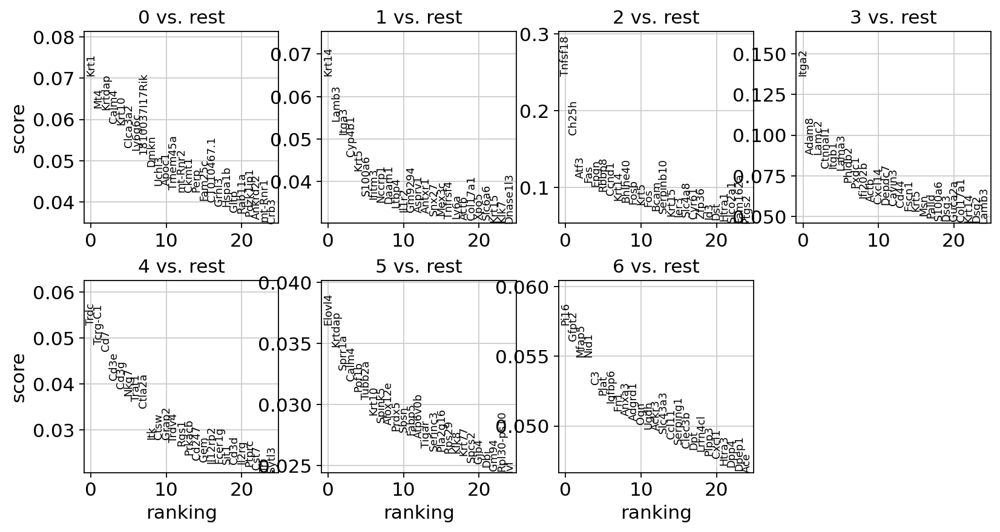

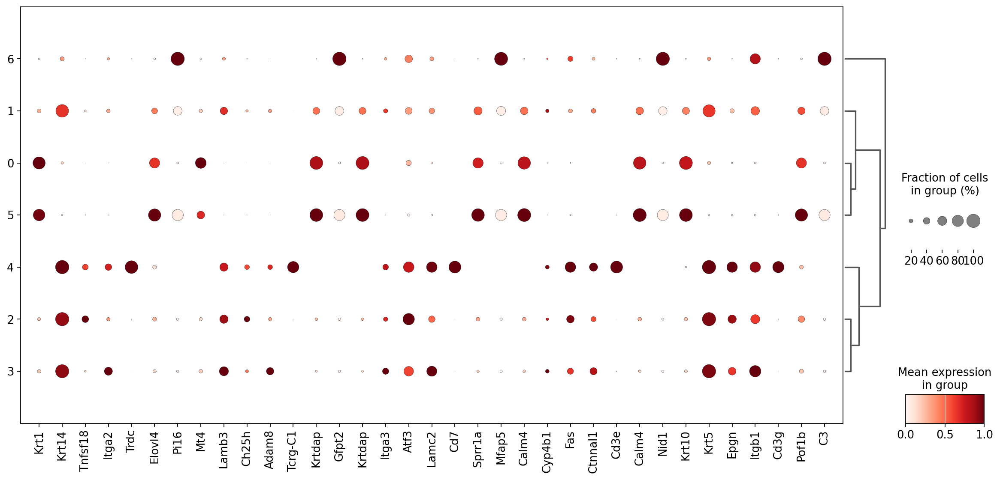

In [122]:
sc.tl.rank_genes_groups(adata, 'leiden', method = 'logreg')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

# sc.pl.rank_genes_groups_violin(adata, n_genes=10)

# pd.DataFrame(adata.uns['rank_genes_groups']['names']).to_csv('./marker_mtx.csv')

top_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(5)
# print(top_markers['10'])

top_markers


import functools
import operator
marker_list = functools.reduce(operator.iconcat, top_markers.values.tolist(),[])
marker_list

sc.tl.dendrogram(adata, 'leiden')
sc.pl.dotplot(adata, marker_list, groupby='leiden', standard_scale = 'var', swap_axes = False, dendrogram = True, figsize = (18,8), dot_max=1.0, dot_min=0.01)

# adata.write_h5ad('/home/jxfeng/DataProcessing/Combined_EC/PLX+6_CD45_CBM.h5ad')

# 2025-02-28 09:16

# adata = sc.read_h5ad('/home/jxfeng/DataProcessing/Combined_EC/PLX+6_CD45_CBM.h5ad')

In [12]:
#### From FerrDb V2 (http://www.zhounan.org/ferrdb/current/)
F_driver = pd.read_table('./UV/ferroptosis_driver.txt')
F_marker = pd.read_table('./UV/ferroptosis_marker.txt')
F_suppressor = pd.read_table('./UV/ferroptosis_suppressor.txt')


In [13]:
f_suppressor = F_suppressor.symbol.str.capitalize()
f_marker = F_suppressor.symbol.str.capitalize()
f_driver = F_driver.symbol.str.capitalize()
f_driver

0         Rpl8
1        Ireb2
2      Atp5mc3
3           Cs
4         Emc2
        ...   
364      Ireb2
365       Cfl1
366     Aloxe3
367     Mir539
368      Kmt2d
Name: symbol, Length: 369, dtype: object

In [165]:
f_driver

0         Rpl8
1        Ireb2
2      Atp5mc3
3           Cs
4         Emc2
        ...   
364      Ireb2
365       Cfl1
366     Aloxe3
367     Mir539
368      Kmt2d
Name: symbol, Length: 369, dtype: object

In [166]:
f_marker

0          Slc7a11
1             Gpx4
2           Akr1c1
3           Akr1c2
4           Akr1c3
          ...     
343    Tmem161b-dt
344     Circepsti1
345         Mir18a
346        Rarres2
347          Usp11
Name: symbol, Length: 348, dtype: object

In [167]:
f_suppressor

0          Slc7a11
1             Gpx4
2           Akr1c1
3           Akr1c2
4           Akr1c3
          ...     
343    Tmem161b-dt
344     Circepsti1
345         Mir18a
346        Rarres2
347          Usp11
Name: symbol, Length: 348, dtype: object

In [14]:
# Check which genes are present in adata
valid_f_driver = [gene for gene in f_driver if gene in adata.var_names]
valid_f_marker = [gene for gene in f_marker if gene in adata.var_names]
valid_f_suppressor = [gene for gene in f_suppressor if gene in adata.var_names]

print(f"Valid Driver Genes: {len(valid_f_driver)}")
print(f"Valid Marker Genes: {len(valid_f_marker)}")
print(f"Valid Suppressor Genes: {len(valid_f_suppressor)}")


Valid Driver Genes: 297
Valid Marker Genes: 269
Valid Suppressor Genes: 269


In [16]:
import scanpy as sc

# Compute ferroptosis scores
sc.tl.score_genes(adata, gene_list=valid_f_driver, score_name="ferroptosis_driver_score")
sc.tl.score_genes(adata, gene_list=valid_f_marker, score_name="ferroptosis_marker_score")
sc.tl.score_genes(adata, gene_list=valid_f_suppressor, score_name="ferroptosis_suppressor_score")


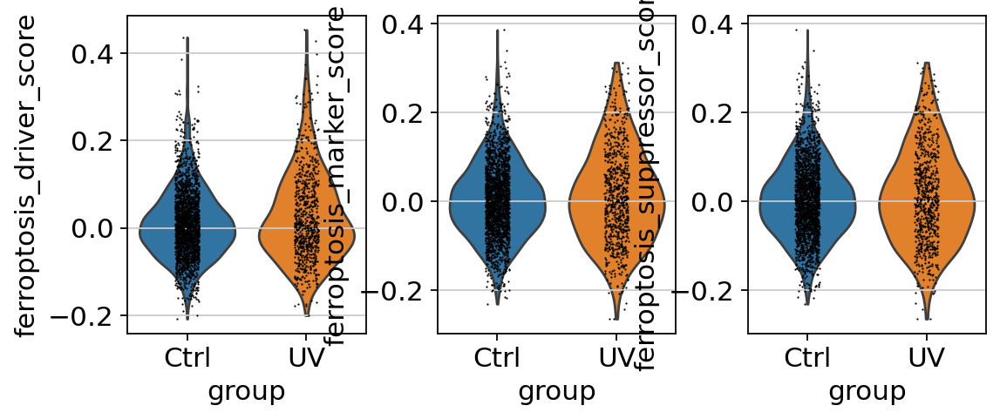

In [17]:
sc.pl.violin(adata, keys=["ferroptosis_driver_score", "ferroptosis_marker_score", "ferroptosis_suppressor_score"], 
             groupby="group", jitter=True)


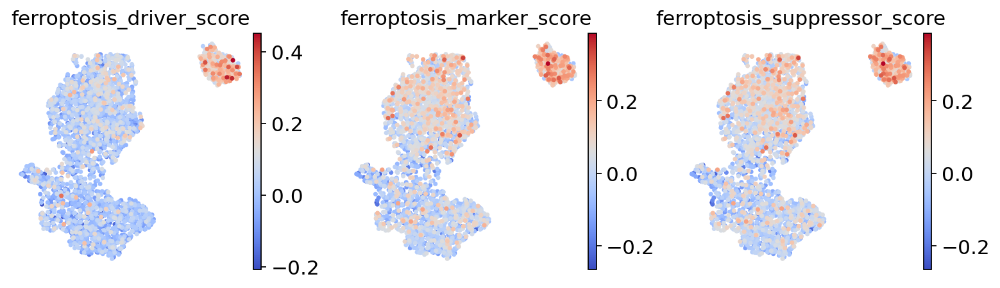

In [18]:
sc.pl.umap(adata, color=["ferroptosis_driver_score", "ferroptosis_marker_score", "ferroptosis_suppressor_score"], cmap="coolwarm")


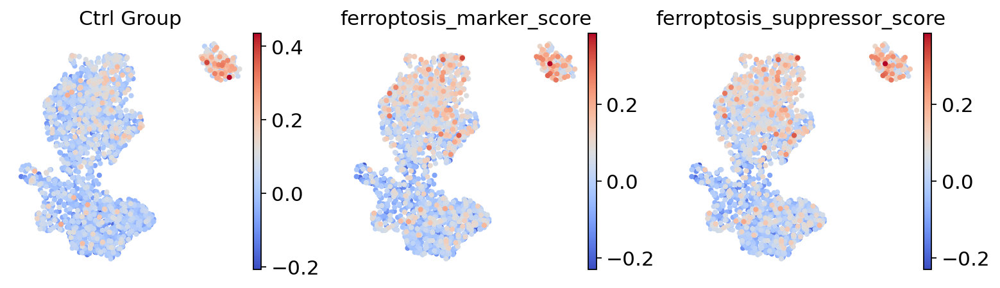

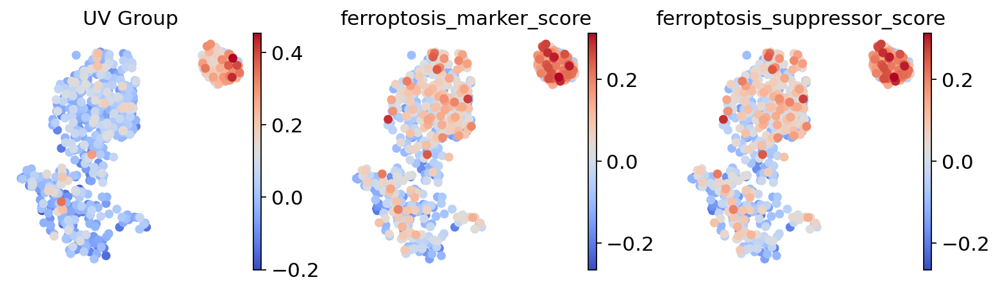

In [19]:
import scanpy as sc

# Subset adata for Ctrl and UV
adata_ctrl = adata[adata.obs["group"] == "Ctrl"]
adata_uv = adata[adata.obs["group"] == "UV"]

# UMAP for Ctrl group
sc.pl.umap(adata_ctrl, color=["ferroptosis_driver_score", "ferroptosis_marker_score", "ferroptosis_suppressor_score"], 
           cmap="coolwarm", title="Ctrl Group")

# UMAP for UV group
sc.pl.umap(adata_uv, color=["ferroptosis_driver_score", "ferroptosis_marker_score", "ferroptosis_suppressor_score"], 
           cmap="coolwarm", title="UV Group")



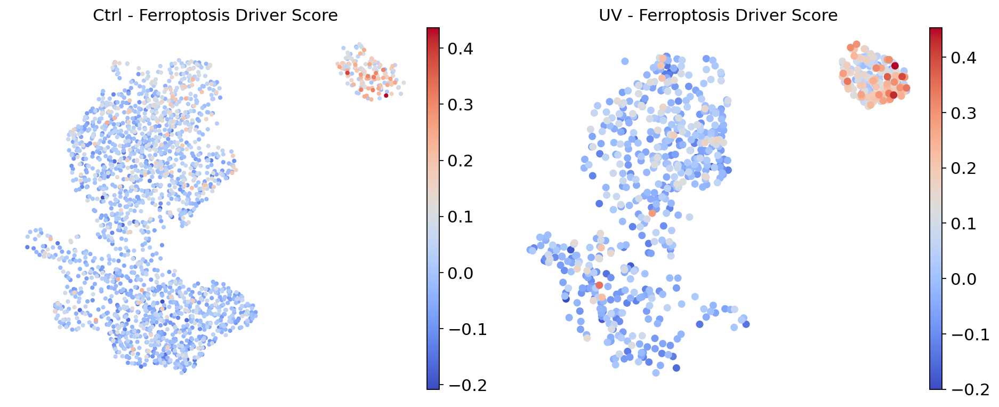

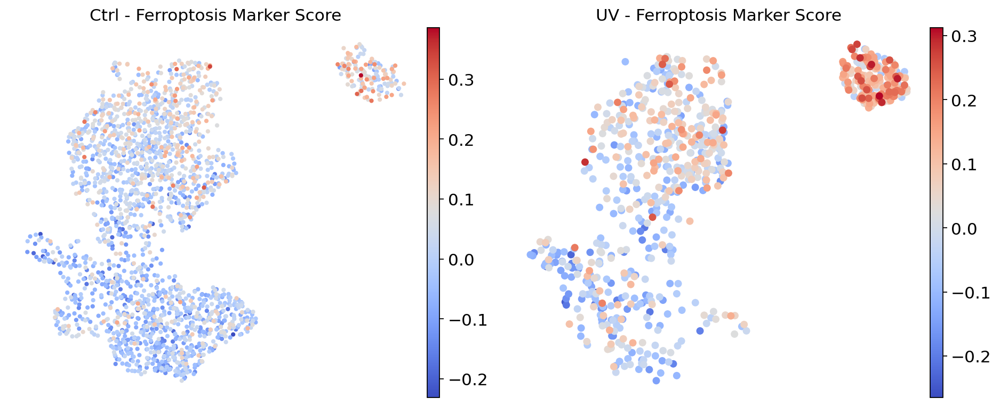

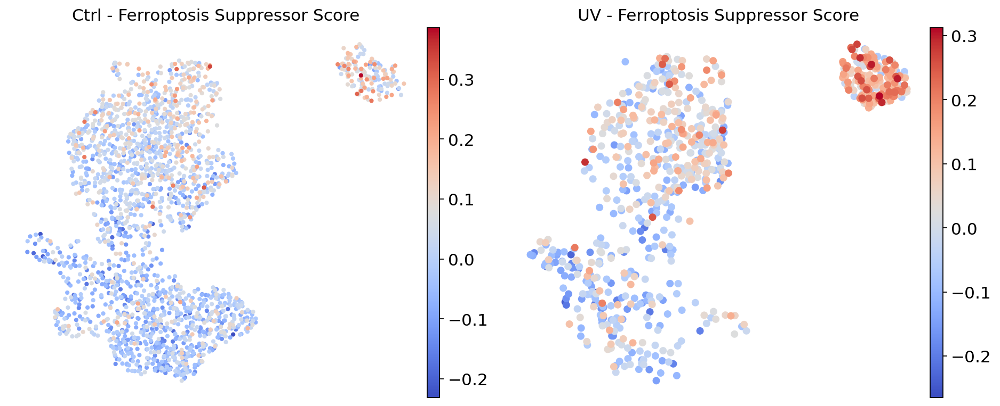

In [20]:
import scanpy as sc
import matplotlib.pyplot as plt

# Define score names and titles
score_names = ["ferroptosis_driver_score", "ferroptosis_marker_score", "ferroptosis_suppressor_score"]
titles = ["Ferroptosis Driver Score", "Ferroptosis Marker Score", "Ferroptosis Suppressor Score"]

# Create three separate side-by-side UMAP comparison figures
for score, title in zip(score_names, titles):
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # Side-by-side for Ctrl and UV

    # Ctrl UMAP
    sc.pl.umap(adata_ctrl, color=score, cmap="coolwarm", ax=axes[0], show=False, title=f"Ctrl - {title}")

    # UV UMAP
    sc.pl.umap(adata_uv, color=score, cmap="coolwarm", ax=axes[1], show=False, title=f"UV - {title}")

    # Adjust layout and show
    plt.tight_layout()
    plt.show()


In [21]:
from scipy.stats import ttest_ind
import pandas as pd

# Prepare a DataFrame with ferroptosis scores and groups
df_scores = adata.obs[["group", "ferroptosis_driver_score", "ferroptosis_marker_score", "ferroptosis_suppressor_score"]]

# Separate Ctrl and UV groups
ctrl_scores = df_scores[df_scores["group"] == "Ctrl"]
uv_scores = df_scores[df_scores["group"] == "UV"]

# Perform t-tests for each score type
t_test_results = {}
for score in ["ferroptosis_driver_score", "ferroptosis_marker_score", "ferroptosis_suppressor_score"]:
    t_stat, p_val = ttest_ind(ctrl_scores[score], uv_scores[score], equal_var=False)  # Welch's t-test
    t_test_results[score] = {"t_statistic": t_stat, "p_value": p_val}

# Convert to DataFrame for easy viewing
t_test_df = pd.DataFrame.from_dict(t_test_results, orient="index")
print(t_test_df)


                              t_statistic   p_value
ferroptosis_driver_score        -4.360147  0.000014
ferroptosis_marker_score        -1.910819  0.056285
ferroptosis_suppressor_score    -1.910819  0.056285


In [22]:
def split_umap(adata, split_by, ncol=2, nrow=None, **kwargs):
    categories = adata.obs[split_by].cat.categories
    if nrow is None:
        nrow = int(np.ceil(len(categories) / ncol))
    fig, axs = plt.subplots(nrow, ncol, figsize=(5*ncol, 4*nrow))
    axs = axs.flatten()
    for i, cat in enumerate(categories):
        ax = axs[i]
        sc.pl.umap(adata[adata.obs[split_by] == cat], ax=ax, show=False, title=cat, **kwargs)
    plt.tight_layout()

In [23]:
adata.obs

,group,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type,treat_celltype,ferroptosis_driver_score,ferroptosis_marker_score,ferroptosis_suppressor_score
AAACATCGAAGGACACTTCACGCA-Ctrl,Ctrl,1229,1229,4729,213,4.504123,0,Keratinocytes,Ctrl_Keratinocytes,-0.054671,-0.038281,-0.038281
AAACATCGAATGTTGCGAATCTGA-Ctrl,Ctrl,1881,1880,6720,158,2.351190,0,Keratinocytes,Ctrl_Keratinocytes,-0.003668,0.011775,0.011775
AAACATCGACATTGGCAGTCACTA-Ctrl,Ctrl,1198,1198,3732,129,3.456592,0,Keratinocytes,Ctrl_Keratinocytes,-0.074273,-0.157408,-0.157408
AAACATCGAGCAGGAATTCACGCA-Ctrl,Ctrl,1043,1043,4193,278,6.630098,1,Basal cells,Ctrl_Basal cells,-0.036227,-0.072161,-0.072161
AAACATCGAGGCTAACCAACCACA-Ctrl,Ctrl,937,937,3194,164,5.134627,0,Keratinocytes,Ctrl_Keratinocytes,-0.009285,-0.108170,-0.108170
...,...,...,...,...,...,...,...,...,...,...,...,...
TTCACGCAATCCTGTAAGATCGCA-UV,UV,1350,1350,5451,188,3.448908,2,Basal cells,UV_Basal cells,0.053455,0.002935,0.002935
TTCACGCACAGATCTGCGACACAC-UV,UV,1507,1507,6225,105,1.686747,6,Fibroblasts,UV_Fibroblasts,0.095581,0.127165,0.127165
TTCACGCACCGAAGTAATAGCGAC-UV,UV,1242,1242,5676,292,5.144468,0,Keratinocytes,UV_Keratinocytes,-0.118097,-0.079169,-0.079169
TTCACGCACCTAATCCACCACTGT-UV,UV,1572,1572,4879,116,2.377536,3,Basal cells,UV_Basal cells,0.007397,0.106547,0.106547


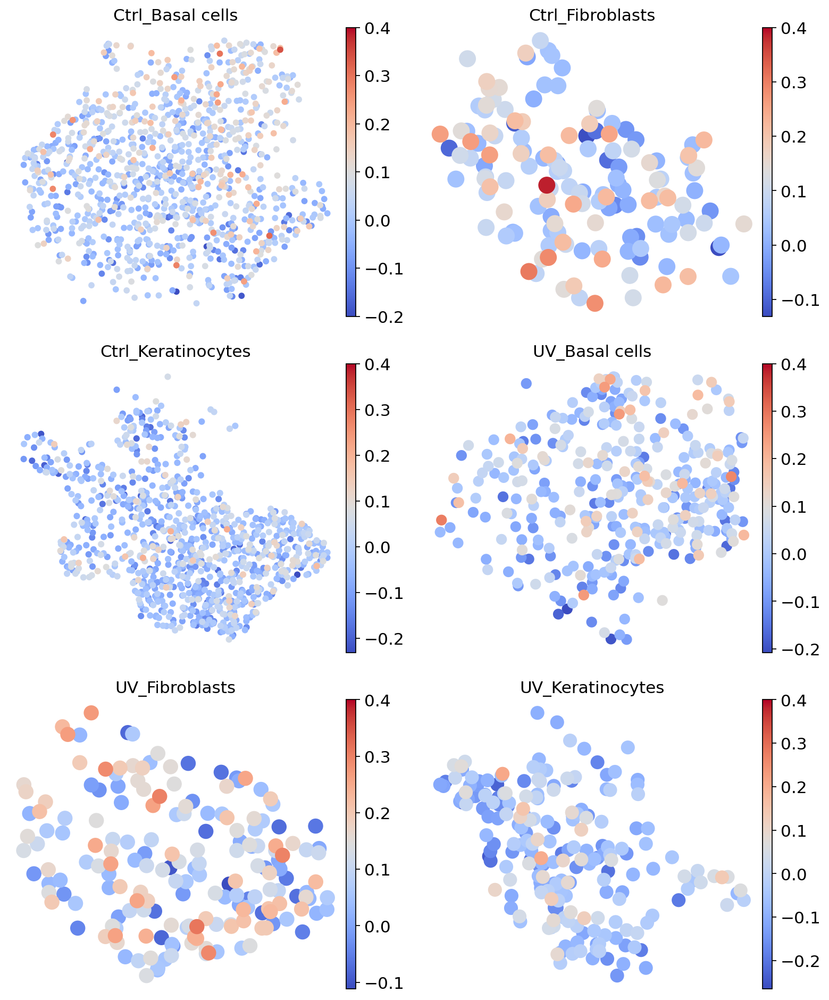

In [24]:
split_umap(adata, color = ['ferroptosis_marker_score'], split_by='treat_celltype',legend_loc = "right margin", cmap="coolwarm", vmax = 0.4)

In [186]:
adata.obs

,group,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type,ferroptosis_driver_score,ferroptosis_marker_score,ferroptosis_suppressor_score
AAACATCGAAGGACACTTCACGCA-Ctrl,Ctrl,1229,1229,4729,213,4.504123,0,Keratinocytes,-0.054671,-0.038281,-0.038281
AAACATCGAATGTTGCGAATCTGA-Ctrl,Ctrl,1881,1880,6720,158,2.351190,0,Keratinocytes,-0.003668,0.011775,0.011775
AAACATCGACATTGGCAGTCACTA-Ctrl,Ctrl,1198,1198,3732,129,3.456592,0,Keratinocytes,-0.074273,-0.157408,-0.157408
AAACATCGAGCAGGAATTCACGCA-Ctrl,Ctrl,1043,1043,4193,278,6.630098,1,Basal cells,-0.036227,-0.072161,-0.072161
AAACATCGAGGCTAACCAACCACA-Ctrl,Ctrl,937,937,3194,164,5.134627,0,Keratinocytes,-0.009285,-0.108170,-0.108170
...,...,...,...,...,...,...,...,...,...,...,...
TTCACGCAATCCTGTAAGATCGCA-UV,UV,1350,1350,5451,188,3.448908,2,Basal cells,0.053455,0.002935,0.002935
TTCACGCACAGATCTGCGACACAC-UV,UV,1507,1507,6225,105,1.686747,6,Fibroblasts,0.095581,0.127165,0.127165
TTCACGCACCGAAGTAATAGCGAC-UV,UV,1242,1242,5676,292,5.144468,0,Keratinocytes,-0.118097,-0.079169,-0.079169
TTCACGCACCTAATCCACCACTGT-UV,UV,1572,1572,4879,116,2.377536,3,Basal cells,0.007397,0.106547,0.106547


Unique groups: ['Ctrl', 'UV']
Categories (2, object): ['Ctrl', 'UV']


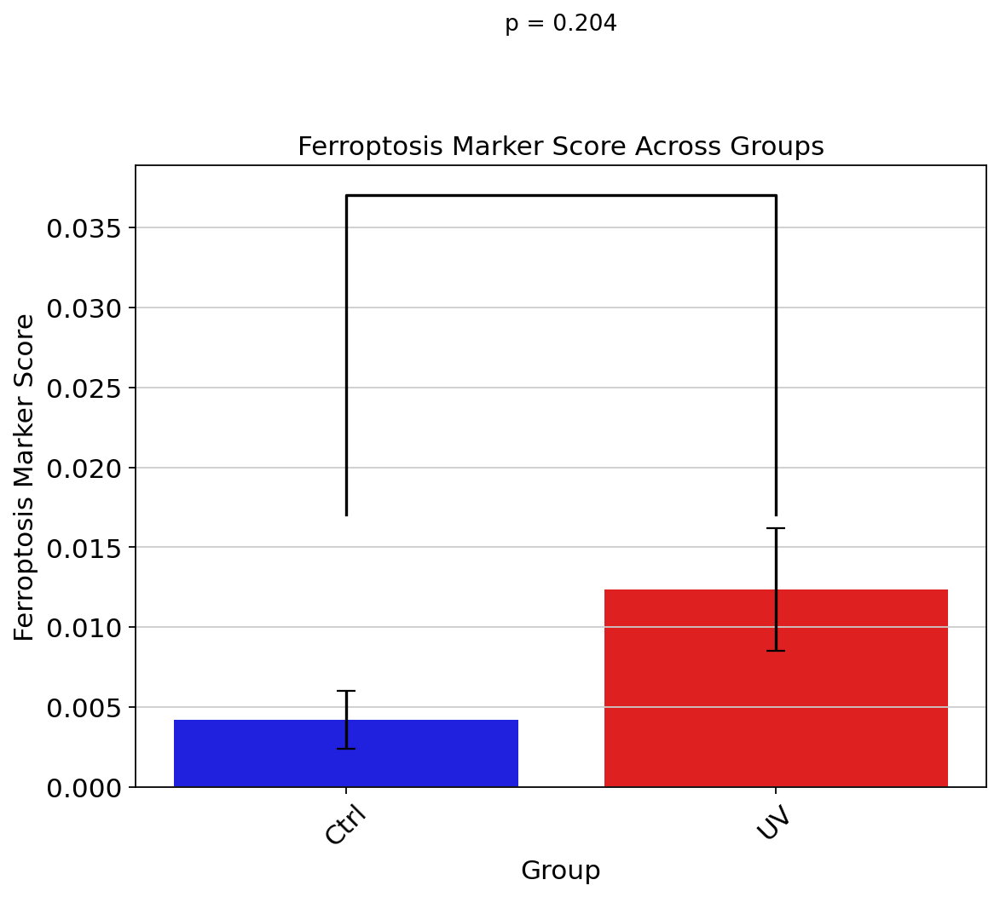

In [192]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats
import itertools

# Convert data into a DataFrame
df = pd.DataFrame({
    "ferroptosis_marker_score": adata.obs["ferroptosis_marker_score"],
    "group": adata.obs["group"]
})

# Print unique group names to check for mismatches
print("Unique groups:", df["group"].unique())

# Ensure categorical data type for proper plotting
df["group"] = df["group"].astype(str)

# Compute mean and standard error for each group
grouped_df = df.groupby("group", observed=True)["ferroptosis_marker_score"].agg(["mean", "sem"]).reset_index()

# Ensure 'sem' has no NaN values
grouped_df["sem"] = grouped_df["sem"].fillna(0)

# Adjust color mapping to match actual group names
color_mapping = {"Ctrl": "blue", "UV": "red"}  # Update this based on actual names

# Create bar plot
plt.figure(figsize=(8, 6))
ax = sns.barplot(data=grouped_df, x="group", y="mean", capsize=0.1, hue="group", palette=color_mapping, legend=False)

# Add error bars
plt.errorbar(grouped_df["group"], grouped_df["mean"], yerr=grouped_df["sem"], fmt='none', ecolor='black', capsize=5)

# Perform statistical tests (Mann-Whitney U test for non-parametric data)
group_names = df["group"].unique()
comparisons = list(itertools.combinations(group_names, 2))  # Pairwise comparisons

for i, (g1, g2) in enumerate(comparisons):
    data1 = df[df["group"] == g1]["ferroptosis_marker_score"]
    data2 = df[df["group"] == g2]["ferroptosis_marker_score"]
    
    # Perform Mann-Whitney U test
    stat, p_value = stats.mannwhitneyu(data1, data2 , alternative="two-sided")

    # Define y position for annotation
    y_max = max(grouped_df["mean"] + grouped_df["sem"])
    y_offset = (i + 1) * 0.05 * y_max  # Adjust spacing for multiple annotations

    # Draw line
    x1, x2 = grouped_df[grouped_df["group"] == g1].index[0], grouped_df[grouped_df["group"] == g2].index[0]
    plt.plot([x1, x1, x2, x2], [y_max + y_offset, y_max + y_offset + 0.02, y_max + y_offset + 0.02, y_max + y_offset], 
             lw=1.5, color="black")

    # Annotate p-value
    p_text = "p = {:.3f}".format(p_value) if p_value >= 0.001 else "p < 0.001"
    plt.text((x1 + x2) / 2, y_max + y_offset + 0.03, p_text, ha="center", va="bottom", fontsize=12)

# Labels and title
plt.xlabel("Group")
plt.ylabel("Ferroptosis Marker Score")
plt.title("Ferroptosis Marker Score Across Groups")
plt.xticks(rotation=45)  # Rotate x-axis labels if necessary
plt.show()


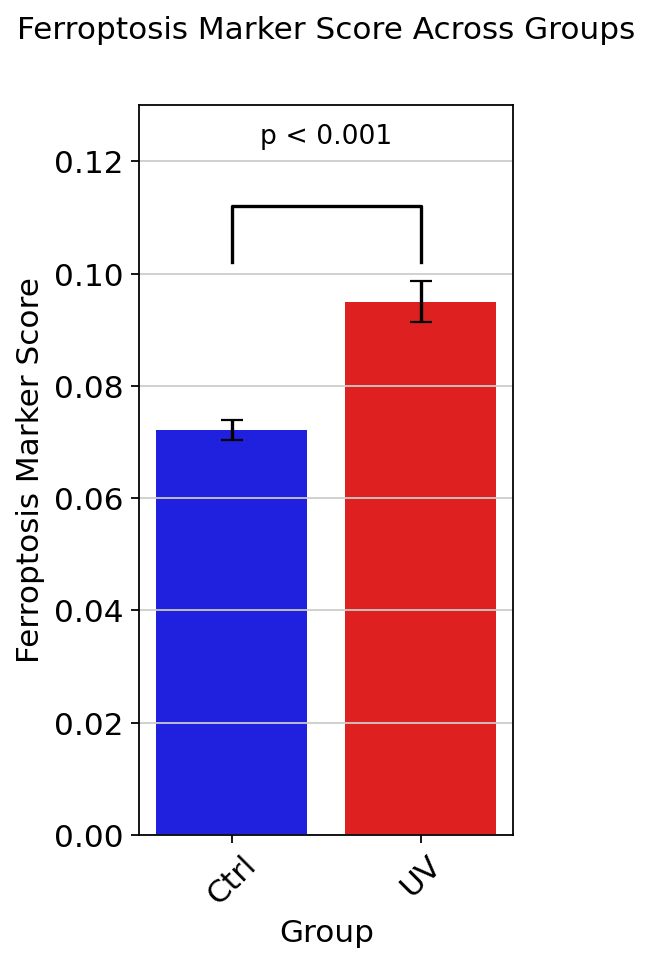

In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats
import itertools

# Filter out cells with zero ferroptosis marker expression
adata_filtered = adata[adata.obs["ferroptosis_marker_score"] > 0].copy()

# Convert data into a DataFrame from filtered adata
df = pd.DataFrame({
    "ferroptosis_marker_score": adata_filtered.obs["ferroptosis_marker_score"],
    "group": adata_filtered.obs["group"]
})

# Ensure categorical data type for proper plotting
df["group"] = df["group"].astype(str)

# Compute mean and standard error for each group
grouped_df = df.groupby("group", observed=True)["ferroptosis_marker_score"].agg(["mean", "sem"]).reset_index()

# Ensure 'sem' has no NaN values
grouped_df["sem"] = grouped_df["sem"].fillna(0)

# Adjust color mapping to match actual group names
color_mapping = {"Ctrl": "blue", "UV": "red"}  # Update based on real group names

# Create bar plot
plt.figure(figsize=(3, 6))
ax = sns.barplot(data=grouped_df, x="group", y="mean", capsize=0.1, hue="group", palette=color_mapping, legend=False)

# Add error bars
plt.errorbar(grouped_df["group"], grouped_df["mean"], yerr=grouped_df["sem"], fmt='none', ecolor='black', capsize=5)

# Perform statistical tests (Mann-Whitney U test for non-parametric data)
group_names = df["group"].unique()
comparisons = list(itertools.combinations(group_names, 2))  # Pairwise comparisons

for i, (g1, g2) in enumerate(comparisons):
    data1 = df[df["group"] == g1]["ferroptosis_marker_score"]
    data2 = df[df["group"] == g2]["ferroptosis_marker_score"]
    
    # Perform Mann-Whitney U test
    stat, p_value = stats.mannwhitneyu(data1, data2, alternative="two-sided")

    # Define y position for annotation
    y_max = max(grouped_df["mean"] + grouped_df["sem"])
    y_min = min(grouped_df["mean"] - grouped_df["sem"])  # Adjust Y-axis lower limit
    y_offset = 0.08 * (y_max - y_min)  # Adjust spacing for multiple annotations

    # Determine x positions
    x1, x2 = grouped_df[grouped_df["group"] == g1].index[0], grouped_df[grouped_df["group"] == g2].index[0]
    
    # Move line up for better spacing
    line_y = y_max + y_offset * 1.5
    plt.plot([x1, x1, x2, x2], [line_y, line_y + 0.01, line_y + 0.01, line_y], lw=1.5, color="black")

    # Move p-value annotation higher
    p_text = "p = {:.3f}".format(p_value) if p_value >= 0.001 else "p < 0.001"
    plt.text((x1 + x2) / 2, line_y + 0.02, p_text, ha="center", va="bottom", fontsize=12)

# Adjust Y-axis to a reasonable range
plt.ylim(0, 0.13)  # Avoid starting from 0 and allow space for annotation

# Labels and title
plt.xlabel("Group")
plt.ylabel("Ferroptosis Marker Score")
plt.title("Ferroptosis Marker Score Across Groups", pad=30)  # Increase padding to avoid overlap
plt.xticks(rotation=45)  # Rotate x-axis labels if necessary
plt.show()


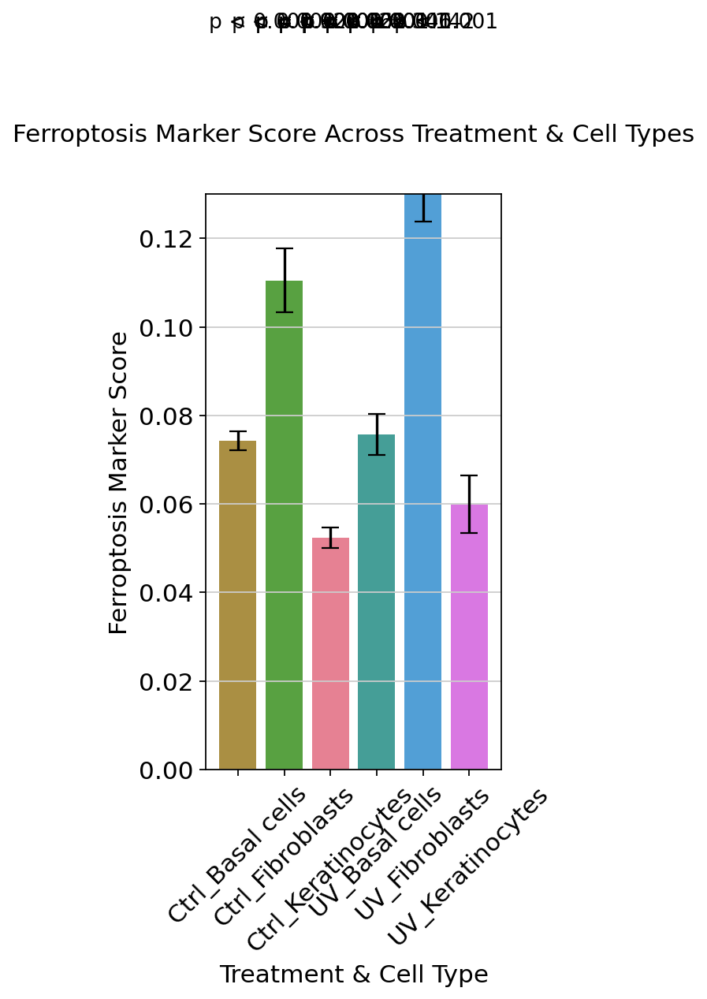

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats as stats
import itertools

# Filter out cells with zero ferroptosis marker expression
adata_filtered = adata[adata.obs["ferroptosis_marker_score"] > 0].copy()

# Convert data into a DataFrame from filtered adata
df = pd.DataFrame({
    "ferroptosis_marker_score": adata_filtered.obs["ferroptosis_marker_score"],
    "treat_celltype": adata_filtered.obs["treat_celltype"]
})

# Ensure categorical data type for proper plotting
df["treat_celltype"] = df["treat_celltype"].astype(str)

# Compute mean and standard error for each treat_celltype
grouped_df = df.groupby("treat_celltype", observed=True)["ferroptosis_marker_score"].agg(["mean", "sem"]).reset_index()

# Ensure 'sem' has no NaN values
grouped_df["sem"] = grouped_df["sem"].fillna(0)

# Dynamically generate color mapping for unique treat_celltype names
color_mapping = {tc: sns.color_palette("husl", len(df["treat_celltype"].unique()))[i] for i, tc in enumerate(df["treat_celltype"].unique())}

# Create bar plot
plt.figure(figsize=(3, 6))
ax = sns.barplot(data=grouped_df, x="treat_celltype", y="mean", capsize=0.1, hue="treat_celltype", palette=color_mapping, legend=False)

# Add error bars
plt.errorbar(grouped_df["treat_celltype"], grouped_df["mean"], yerr=grouped_df["sem"], fmt='none', ecolor='black', capsize=5)

# Perform statistical tests (Mann-Whitney U test for non-parametric data)
group_names = df["treat_celltype"].unique()
comparisons = list(itertools.combinations(group_names, 2))  # Pairwise comparisons

for i, (g1, g2) in enumerate(comparisons):
    data1 = df[df["treat_celltype"] == g1]["ferroptosis_marker_score"]
    data2 = df[df["treat_celltype"] == g2]["ferroptosis_marker_score"]
    
    # Perform Mann-Whitney U test
    stat, p_value = stats.mannwhitneyu(data1, data2, alternative="two-sided")

    # Define y position for annotation
    y_max = max(grouped_df["mean"] + grouped_df["sem"])
    y_min = min(grouped_df["mean"] - grouped_df["sem"])  # Adjust Y-axis lower limit
    y_offset = 0.08 * (y_max - y_min)  # Adjust spacing for multiple annotations

    # Determine x positions
    x1, x2 = grouped_df[grouped_df["treat_celltype"] == g1].index[0], grouped_df[grouped_df["treat_celltype"] == g2].index[0]
    
    # Move line up for better spacing
    line_y = y_max + y_offset * 1.5
    plt.plot([x1, x1, x2, x2], [line_y, line_y + 0.01, line_y + 0.01, line_y], lw=1.5, color="black")

    # Move p-value annotation higher
    p_text = "p = {:.3f}".format(p_value) if p_value >= 0.001 else "p < 0.001"
    plt.text((x1 + x2) / 2, line_y + 0.02, p_text, ha="center", va="bottom", fontsize=12)

# Adjust Y-axis to a reasonable range
plt.ylim(0, 0.13)  # Avoid starting from 0 and allow space for annotation

# Labels and title
plt.xlabel("Treatment & Cell Type")
plt.ylabel("Ferroptosis Marker Score")
plt.title("Ferroptosis Marker Score Across Treatment & Cell Types", pad=30)  # Increase padding to avoid overlap
plt.xticks(rotation=45)  # Rotate x-axis labels if necessary
plt.show()


In [216]:
adata_filtered = adata[adata.obs["ferroptosis_marker_score"] > 0].copy()

In [267]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

# Ensure you have filtered the dataset before running
# adata_filtered = adata[adata.obs["ferroptosis_marker_score"] > 0].copy()

# Extract ferroptosis gene list from adata
ferroptosis_genes = [gene for gene in adata_filtered.var_names if gene in adata_filtered.to_df().columns]

# Extract expression values for ferroptosis genes
df_genes = adata_filtered.to_df()[ferroptosis_genes]
df_genes["group"] = adata_filtered.obs["group"]

# Compute mean expression for each group
mean_expr = df_genes.groupby("group").mean()

# Compute log2 fold change (LFC) between UV and Ctrl
log2_fc = np.log2(mean_expr.loc["UV"] / mean_expr.loc["Ctrl"])
log2_fc_sorted = log2_fc.sort_values(ascending=False)

# Perform Mann-Whitney U test for each gene
p_values = {}
for gene in ferroptosis_genes:
    ctrl_expr = df_genes[df_genes["group"] == "Ctrl"][gene]
    uv_expr = df_genes[df_genes["group"] == "UV"][gene]
    
    stat, p = mannwhitneyu(ctrl_expr, uv_expr, alternative="two-sided")
    p_values[gene] = p

# Convert p-values to DataFrame
p_values_df = pd.DataFrame.from_dict(p_values, orient="index", columns=["p_value"])

# Apply multiple testing correction (FDR)
p_values_df["adj_p_value"] = multipletests(p_values_df["p_value"], method="fdr_bh")[1]

# Merge log2 fold change and p-values
results = pd.concat([log2_fc_sorted, p_values_df], axis=1)
results.columns = ["log2FC", "p_value", "adj_p_value"]

# Save results to CSV
results.to_csv("ferroptosis_gene_changes.csv")
print("Results saved to ferroptosis_gene_changes.csv")


/tmp/ipykernel_264657/227235257.py:18: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_expr = df_genes.groupby("group").mean()
/home/jxfeng/miniforge3/lib/python3.12/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


Results saved to ferroptosis_gene_changes.csv



Top significantly changed ferroptosis genes:
            log2FC       p_value   adj_p_value
Fam208a  12.279077  1.741834e-12  3.744198e-12
Wdr91    11.715748  5.767125e-04  6.808957e-04
Cdk7     11.451472  1.354538e-02  1.508519e-02
Emx2     11.192657  1.067625e-08  1.604553e-08
Dusp7    10.573879  2.176304e-13  5.335543e-13
Cebpd    10.094658  9.876468e-10  1.605531e-09
Rgs6     10.040486  4.481118e-17  3.128153e-16
Gm7658   10.026260  1.037818e-07  1.461247e-07
Sppl2a    9.789183  3.035165e-02  3.330175e-02
Il31ra    9.340535  4.787710e-06  6.190688e-06


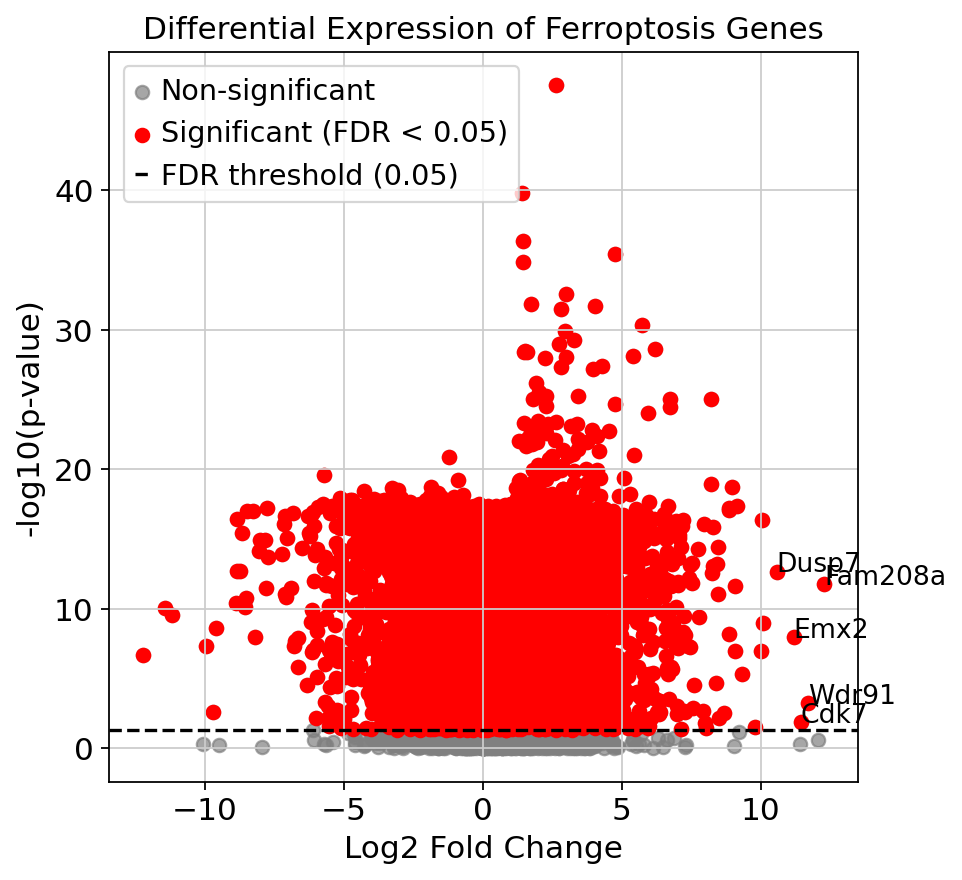

In [219]:
# Display significant results
significant_results = results[results["adj_p_value"] < 0.05].sort_values(by="log2FC", ascending=False)
print("\nTop significantly changed ferroptosis genes:")
print(significant_results.head(10))  # Show top 10 genes

# Plot Volcano Plot
plt.figure(figsize=(6,6))
plt.scatter(results["log2FC"], -np.log10(results["p_value"]), color="gray", alpha=0.7, label="Non-significant")

# Highlight significant genes
sig_genes = results[results["adj_p_value"] < 0.05]
plt.scatter(sig_genes["log2FC"], -np.log10(sig_genes["p_value"]), color="red", label="Significant (FDR < 0.05)")

# Annotate top 5 changed genes
top_genes = sig_genes.nlargest(5, "log2FC")
for gene in top_genes.index:
    plt.text(top_genes.loc[gene, "log2FC"], -np.log10(top_genes.loc[gene, "p_value"]), gene, fontsize=12)

plt.axhline(-np.log10(0.05), linestyle="--", color="black", label="FDR threshold (0.05)")
plt.xlabel("Log2 Fold Change")
plt.ylabel("-log10(p-value)")
plt.title("Differential Expression of Ferroptosis Genes")
plt.legend()
plt.show()



Top significantly changed ferroptosis genes (|log2FC| > 2, p < 0.0001, lowest adj_p_value):
            log2FC       p_value   adj_p_value  significant
Pdzk1ip1  2.635375  3.038487e-48  1.486884e-44         True
Ifitm3    1.422626  1.591605e-40  3.115407e-37         True
Ly6a      1.446203  4.257269e-37  5.555452e-34         True
Hspa1a    4.772566  4.090743e-36  5.004512e-33         True
S100a6    1.448972  1.354583e-35  1.559683e-32         True
Malat1    2.998877  2.594217e-33  2.418058e-30         True
Pkib      1.754676  1.576416e-32  1.402580e-29         True
Dapl1     4.052812  1.877464e-32  1.597804e-29         True
Cdkn1a    2.828654  3.461075e-32  2.709883e-29         True
Crip1     5.747702  4.786163e-31  2.755422e-28         True
Krt80     2.960022  1.179493e-30  6.413168e-28         True
Ccl7      3.268568  5.097208e-30  2.558276e-27         True
Fam25c    2.753459  1.150277e-29  5.491590e-27         True
Tuba4a    6.190614  2.648170e-29  1.205472e-26         True
Krtdap 

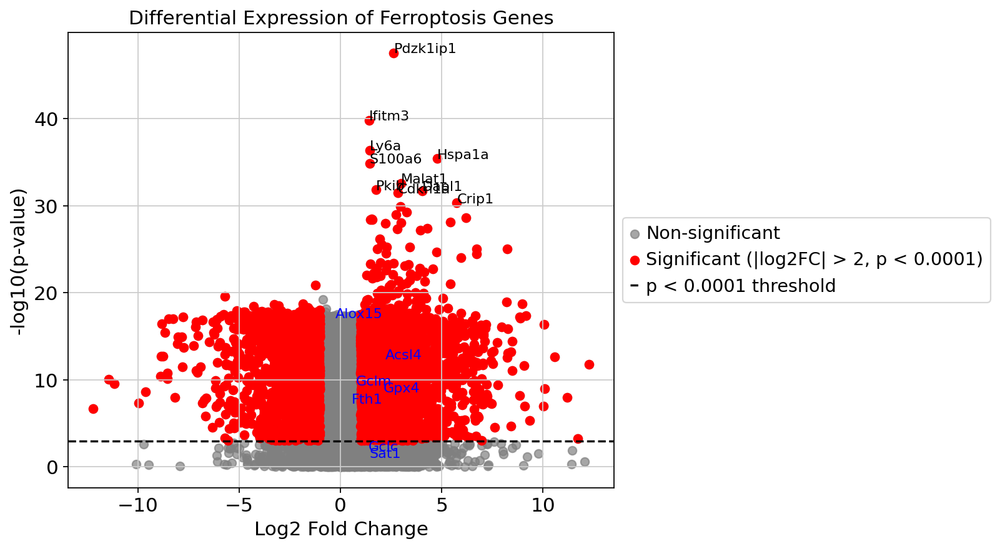

In [238]:
# Display top significantly changed genes by adj_p_value
print("\nTop significantly changed ferroptosis genes (|log2FC| > 2, p < 0.0001, lowest adj_p_value):")
print(filtered_results.sort_values(by="adj_p_value", ascending=True).head(15))  # Show top 15 genes

# Plot Volcano Plot
plt.figure(figsize=(7,6))
plt.scatter(results["log2FC"], -np.log10(results["p_value"]), color="gray", alpha=0.7, label="Non-significant")

# Highlight significant genes based on log2FC & p-value combined
sig_genes = results[results["significant"]]
plt.scatter(sig_genes["log2FC"], -np.log10(sig_genes["p_value"]), color="red", label="Significant (|log2FC| > 2, p < 0.0001)")

# Get the top 15 genes with the lowest adj_p_value
top_genes = sig_genes.nsmallest(10, "adj_p_value").index.tolist()

# Define famous ferroptosis-related genes (mouse)
famous_ferroptosis_genes = ["Gpx4", "Slc7a11", "Acsl4", "Alox15", "Fth1", 
                             "Tfrc", "Ncoa4", "Gclc","Gclm","Sat1"]

# Combine both lists, avoiding duplicates
genes_to_annotate = list(set(top_genes + famous_ferroptosis_genes))

# Annotate selected genes
for gene in genes_to_annotate:
    if gene in results.index:
        color = "blue" if gene in famous_ferroptosis_genes else "black"  # Blue for ferroptosis-related genes
        plt.text(results.loc[gene, "log2FC"], -np.log10(results.loc[gene, "p_value"]), 
                 gene, fontsize=10, color=color)


plt.axhline(-np.log10(0.001), linestyle="--", color="black", label="p < 0.0001 threshold")
plt.xlabel("Log2 Fold Change")
plt.ylabel("-log10(p-value)")
plt.title("Differential Expression of Ferroptosis Genes")
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.show()

In [277]:
degs_per_celltype[cell_type] = significant_genes["names"].dropna().tolist()


In [280]:
import scanpy as sc
import pandas as pd
import gseapy as gp

# Ensure adata is properly formatted
assert "group" in adata.obs.columns, "Group (Ctrl/UV) not found in adata.obs"
assert "cell_type" in adata.obs.columns, "Cell type column missing in adata.obs"

# Store all results
degs_per_celltype = {}

# Loop over each cell type
for cell_type in adata.obs["cell_type"].unique():
    print(f"Processing {cell_type}...")

    # Subset data for current cell type
    adata_subset = adata[adata.obs["cell_type"] == cell_type].copy()

    # Perform differential expression analysis between Ctrl and UV
    sc.tl.rank_genes_groups(adata_subset, groupby="group", method="wilcoxon")

    # Convert DE results into DataFrame
    de_results = sc.get.rank_genes_groups_df(adata_subset, group="UV")

    # Filter significant genes (|log2FC| > 1, p-value < 0.05)
    significant_genes = de_results[(abs(de_results["logfoldchanges"]) > 1) & (de_results["pvals"] < 0.05)]

    # Store results
    degs_per_celltype[cell_type] = significant_genes["names"].tolist()



Processing Keratinocytes...


/home/jxfeng/miniforge3/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jxfeng/miniforge3/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


Processing Basal cells...


/home/jxfeng/miniforge3/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jxfeng/miniforge3/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


Processing Fibroblasts...


/home/jxfeng/miniforge3/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(
/home/jxfeng/miniforge3/lib/python3.12/site-packages/scanpy/tools/_rank_genes_groups.py:461: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, "logfoldchanges"] = np.log2(


In [299]:
# Save results for later use
degs_df = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in degs_per_celltype.items()]))
degs_df.to_csv("DEGs_per_celltype.csv", index=False)
print("Differential expression results saved.")

# KEGG Analysis per cell type
for cell_type, genes in degs_per_celltype.items():
    print(f"\nRunning KEGG analysis for {cell_type}...")

    if len(genes) == 0:
        print(f"No significant genes found for {cell_type}. Skipping KEGG analysis.")
        continue

    # Run KEGG Enrichment Analysis
    kegg_results = gp.enrichr(gene_list=genes, 
                              gene_sets='GO_Biological_Process_2023',  # Use the correct KEGG database for mouse
                              organism='mouse', 
                              outdir=None)

    # Convert to DataFrame
    kegg_df = kegg_results.results

Differential expression results saved.

Running KEGG analysis for Keratinocytes...

Running KEGG analysis for Basal cells...

Running KEGG analysis for Fibroblasts...


In [300]:
kegg_df

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2023,Protein Localization To Golgi Apparatus (GO:00...,13/28,0.000088,0.248041,0,0,4.857231,4.538029e+01,GBP5;RIPOR1;GBF1;PAQR3;VPS13D;ARL1;CSNK1D;RAB3...
1,GO_Biological_Process_2023,Organophosphate Ester Transport (GO:0015748),12/25,0.000110,0.248041,0,0,5.172282,4.715143e+01,SCARB1;PRELID2;PITPNM1;VAPA;NPC2;PITPNB;OSBP;E...
2,GO_Biological_Process_2023,Proteoglycan Metabolic Process (GO:0006029),11/25,0.000546,0.776451,0,0,4.400883,3.306376e+01,CSGALNACT1;BMPR2;CANT1;CHST12;CSGALNACT2;XYLT1...
3,GO_Biological_Process_2023,Collagen Fibril Organization (GO:0030199),15/42,0.000847,0.776451,0,0,3.113464,2.202432e+01,COL27A1;COL14A1;LUM;LOXL4;PLOD3;LOXL2;COL3A1;C...
4,GO_Biological_Process_2023,Protein Quality Control For Misfolded Or Incom...,11/27,0.001191,0.776451,0,0,3.850318,2.592265e+01,BAG6;ZYG11B;UBE2W;VCP;KLHL15;CLPP;DERL1;LONP1;...
...,...,...,...,...,...,...,...,...,...,...
4510,GO_Biological_Process_2023,Regulation Of Cation Channel Activity (GO:2001...,1/56,0.999900,0.999996,0,0,0.101258,1.016190e-05,DLG1
4511,GO_Biological_Process_2023,Sodium Ion Transport (GO:0006814),2/89,0.999989,0.999996,0,0,0.127827,1.356565e-06,SLC6A19;SLC6A12
4512,GO_Biological_Process_2023,Regulation Of Transcription By RNA Polymerase ...,237/2028,0.999991,0.999996,0,0,0.717030,6.607992e-06,ATF2;CCNC;ELK1;ELK3;DCAF6;HOXA9;RPS6KA5;CREB3L...
4513,GO_Biological_Process_2023,Sensory Perception Of Smell (GO:0007608),1/230,0.999995,0.999996,0,0,0.024069,1.164332e-07,UBR3


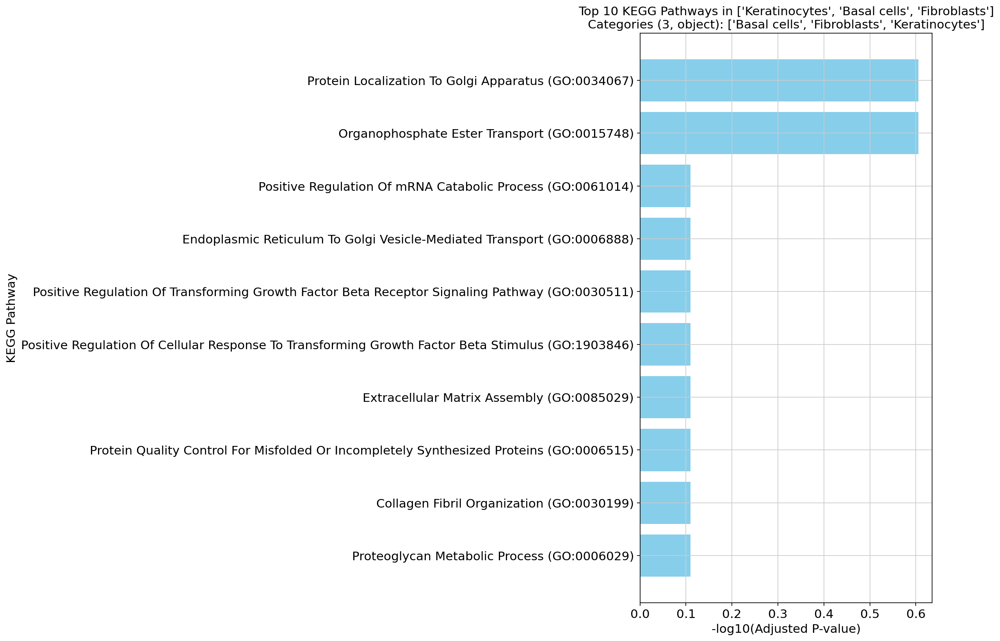

In [302]:
import pandas as pd
import matplotlib.pyplot as plt

# Load KEGG results for a specific cell type
cell_type = adata.obs["cell_type"].unique()  # Change to an actual cell type in your data


# Sort by adjusted p-value and take the top 10 pathways
top_kegg = kegg_df.sort_values(by="Adjusted P-value").head(10)

# Plot bar chart
plt.figure(figsize=(6,12))
plt.barh(top_kegg["Term"], -np.log10(top_kegg["Adjusted P-value"]), color='skyblue')
plt.xlabel("-log10(Adjusted P-value)")
plt.ylabel("KEGG Pathway")
plt.title(f"Top 10 KEGG Pathways in {cell_type}")
plt.gca().invert_yaxis()  # Invert to show the most enriched at the top
plt.show()


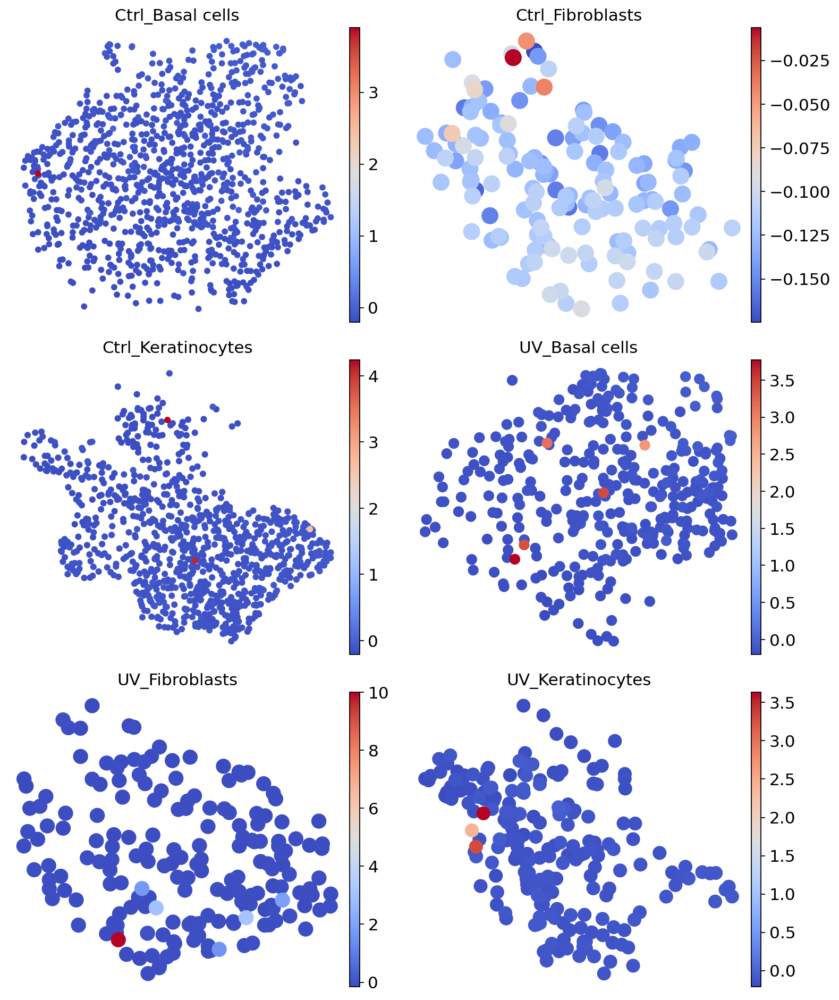

In [28]:
split_umap(adata, split_by='treat_celltype', color='Fabp4', cmap="coolwarm", legend_loc="right margin") 

In [60]:
adata.obs

,group,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,cell_type,treat_celltype
AAACATCGAAGGACACTTCACGCA-Ctrl,Ctrl,1229,1229,4729,213,4.504123,7,Keratinocytes,Ctrl_Keratinocytes
AAACATCGAATGTTGCGAATCTGA-Ctrl,Ctrl,1881,1880,6720,158,2.351190,7,Keratinocytes,Ctrl_Keratinocytes
AAACATCGACATTGGCAGTCACTA-Ctrl,Ctrl,1198,1198,3732,129,3.456592,7,Keratinocytes,Ctrl_Keratinocytes
AAACATCGAGCAGGAATTCACGCA-Ctrl,Ctrl,1043,1043,4193,278,6.630098,4,Basal cells,Ctrl_Basal cells
AAACATCGAGGCTAACCAACCACA-Ctrl,Ctrl,937,937,3194,164,5.134627,7,Keratinocytes,Ctrl_Keratinocytes
...,...,...,...,...,...,...,...,...,...
TTCACGCAATCCTGTAAGATCGCA-UV,UV,1350,1350,5451,188,3.448908,4,Basal cells,UV_Basal cells
TTCACGCACAGATCTGCGACACAC-UV,UV,1507,1507,6225,105,1.686747,14,Fibroblasts,UV_Fibroblasts
TTCACGCACCGAAGTAATAGCGAC-UV,UV,1242,1242,5676,292,5.144468,7,Keratinocytes,UV_Keratinocytes
TTCACGCACCTAATCCACCACTGT-UV,UV,1572,1572,4879,116,2.377536,4,Basal cells,UV_Basal cells


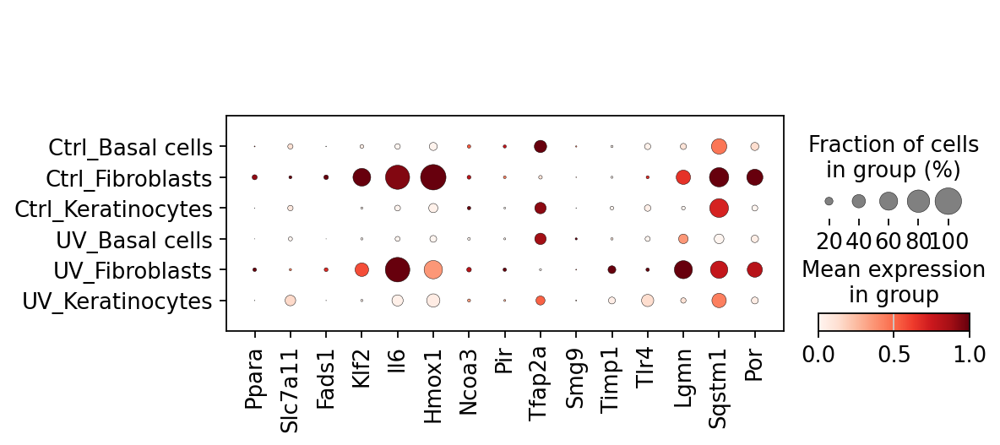

In [62]:
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc

target_genes = list(set([
    'Tlr4', 'Chac1', 'Hmox1', 'Por', 'Fabp4', 'Fth1', 'Gpx4', 'Slc7a11',
    "Aloxe3", "Gja1", "Tlr4", "Map1lc3a", "Klf2", "Chac1", "Il6", "Mmd",
    "Tnfaip3", "Timp1", "Paqr3", "Atg16l1", "Hmox1", "Lig3", "Mb21d1",
     "Hif1a", "Aqp3", "Lgmn", "Panx1", "Pex3", "Fads1", "Por",
    "Pgrmc1", "Smg9", "Fabp4", "Adamts13", "Rarres2",
    "Srebf1", "Ppara", "Pir", "Mef2c", "Lcn2", "Pdss2", "Prom2",
    "Pla2g6", "Aldh3a2", "Parp11", "Parp4", "Cav1", "Fth1", "Tfap2a",
    "Acot1", "Gpx4", "Ncoa3", "Slc7a11", "Sqstm1", "Tmsb4x"
]))

target_genes = list(set([ 'Smg9', 'Hmox1', 'Sqstm1', 'Por', 'Tlr4', 'Klf2', 'Il6', 'Slc7a11', 'Lgmn', 'Timp1', 'Tfap2a', 'Ppara', 'Fads1', 'Pir', 'Ncoa3']))

sc.pl.dotplot(adata, target_genes, groupby="treat_celltype", standard_scale="var")

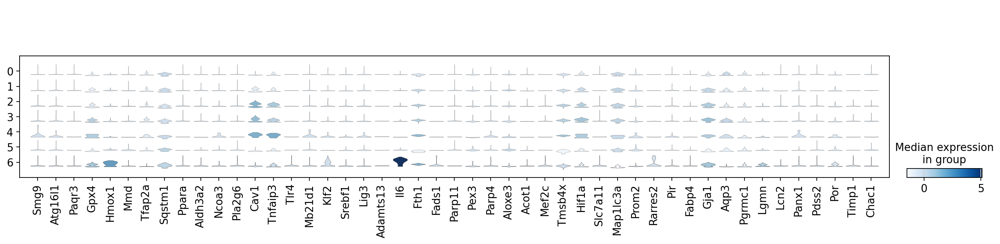

In [330]:
sc.pl.stacked_violin(adata, target_genes, groupby="leiden")